<a href="https://colab.research.google.com/github/NikitinaNK/cs-lab02/blob/main/VKR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
os.chdir('/content/drive/MyDrive/Colab Notebooks/vkr')


In [23]:
# импорт модулей
from tensorflow import keras
import matplotlib.pyplot as plt
import numpy as np
import sklearn
import numpy as np
import lab02_lib as lib
import lab02_min_lib as lib_min
import lab02_mean_lib as lib_mean
import lab02_3d_lib as lib_3d


## Эллипс


[[-0.14541382  0.3355095 ]
 [ 0.35670491 -0.17454584]
 [-0.21392217 -0.51748204]
 ...
 [-0.13411078 -0.14966689]
 [ 0.09555988  0.26268976]
 [ 0.21442419 -0.44080174]]


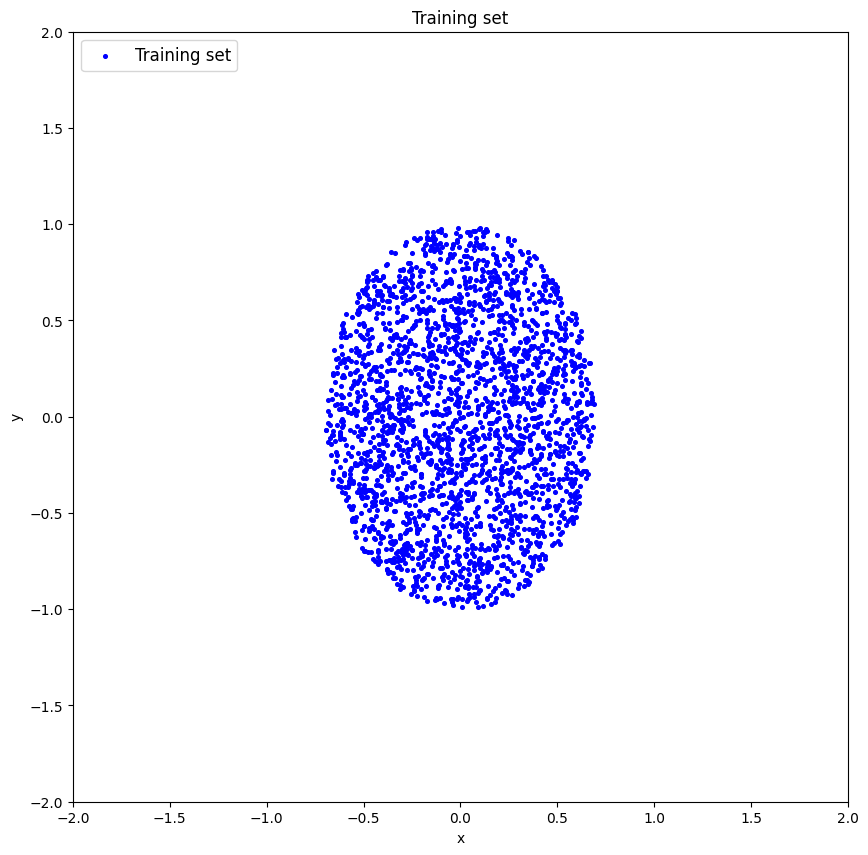

In [3]:
# Функция для генерации координат точки
def generate_point():
  # Генерируем два случайных числа в диапазоне [-1, 1]
  x = np.random.uniform(-1, 1)
  y = np.random.uniform(-1, 1)
  return np.array([x, y])

# Функция для проверки, попадает ли точка внутрь круга
def is_inside_circle(point, center, vert_radius, hor_radius):
    x, y = point
    cx, cy = center

    distance_x = abs(x - cx)
    distance_y = abs(y - cy)

    if distance_x**2 / hor_radius**2 + distance_y**2 / vert_radius**2 <= 1:
        return True
    else:
        return False

# Параметры
n_points = 2500  # Количество точек
vert_radius = 1  # Радиус по вертикали
hor_radius = 0.7  # Радиус по горизонтали

# Центры кругов
center = np.array([0, 0])

# Генерация массива точек
points = np.empty((n_points, 2))
for i in range(n_points):
  # Генерируем точку
  point = generate_point()

  # Проверяем, попадает ли она внутрь обоих кругов
  while not is_inside_circle(point, center, vert_radius, hor_radius):
    point = generate_point()

  # Добавляем точку в массив
  points[i] = point

# Печать массива точек
print(points)

data_el = points
plt.figure(figsize=(10,10))
plt.scatter(points[:,0],points[:,1],marker='o',s=7,color='b',label='Training set')
plt.legend(loc= 'upper left',fontsize=12)
plt.title('Training set')
plt.xlabel('x')
plt.ylabel('y')
plt.xlim([-2, 2])
plt.ylim([-2, 2])
plt.show()


## эллипсоид

[[-0.3686878   0.31018057 -0.46054046]
 [ 0.007056    0.3819153   0.51550407]
 [ 0.17794447  0.14301382 -0.05921693]
 ...
 [ 0.47402177  0.23966649  0.28013267]
 [-0.32232134  0.73730924 -0.2085706 ]
 [ 0.23516437 -0.51505992 -0.08262712]]


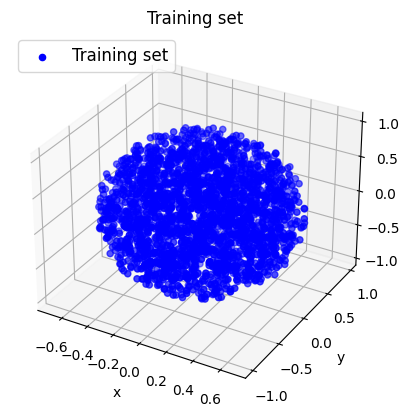

In [4]:
from mpl_toolkits.mplot3d import Axes3D


# Функция для генерации координат точки
def generate_point():
  # Генерируем два случайных числа в диапазоне [-1, 1]
  x = np.random.uniform(-1, 1)
  y = np.random.uniform(-1, 1)
  z = np.random.uniform(-1, 1)

  return np.array([x, y, z])

# Функция для проверки, попадает ли точка внутрь круга
def is_inside_circle(point, center, vert_radius, hor_radius, z_rad):
    x, y, z = point
    cx, cy, cz = center

    distance_x = abs(x - cx)
    distance_y = abs(y - cy)
    distance_z = abs(z - cz)


    if distance_x**2 / hor_radius**2 + distance_y**2 / vert_radius**2 +distance_z**2 / z_rad**2 <= 1:
        return True
    else:
        return False

# Параметры
n_points = 2500  # Количество точек
vert_radius = 1  # Радиус по вертикали
hor_radius = 0.7  # Радиус по горизонтали
z_rad = 1

# Центры кругов
center = np.array([0, 0, 0])

# Генерация массива точек
points = np.empty((n_points, 3))
for i in range(n_points):
  # Генерируем точку
  point = generate_point()

  # Проверяем, попадает ли она внутрь обоих кругов
  while not is_inside_circle(point, center, vert_radius, hor_radius,z_rad):
    point = generate_point()

  # Добавляем точку в массив
  points[i] = point

# Печать массива точек
print(points)

data = points
fig = plt.figure()
ax = Axes3D(fig)
ax = fig.add_subplot(projection='3d')

ax.scatter(points[:,0],points[:,1], points[:,2],marker='o',color='b',label='Training set')
ax.legend(loc= 'upper left',fontsize=12)
plt.title('Training set')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')


plt.show()

In [11]:
points.shape[1]

3

In [ ]:
points[1]

array([ 0.23814357, -0.17422776, -0.79857652])

In [12]:
 for i in range(len(points[1])):
  print (i)

0
1
2


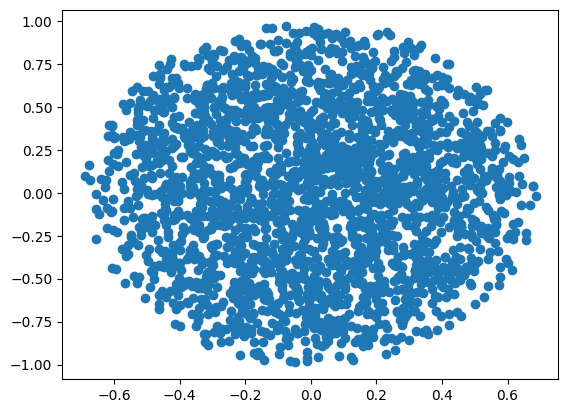

In [ ]:
plt.plot(points[:,0], points[:,1], 'o')


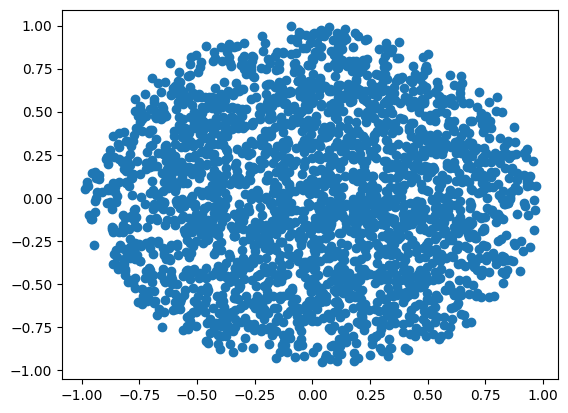

In [ ]:
plt.plot(points[:,1], points[:,2], 'o')


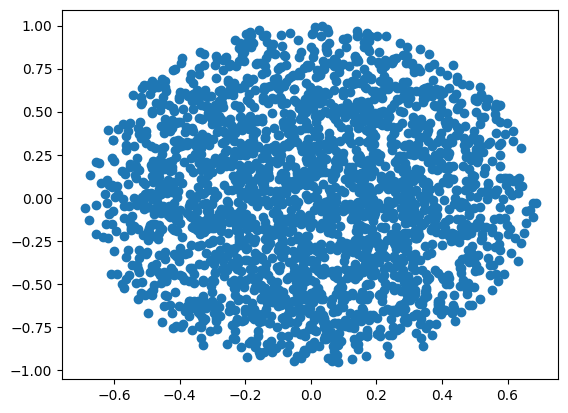

In [ ]:
plt.plot(points[:,0], points[:,2], 'o')


In [22]:
# обучение AE1 (3 3 2 1 2 3 3)
patience = 1000
ae1_trained, IRE1, IREth1 = lib_3d.create_fit_save_ae(data,'out/AE1.h5','out/AE1_ire_th.txt',
10000, True, patience)

Выходные данные были обрезаны до нескольких последних строк (5000).
Epoch 7502/10000
1/1 [==============================] - 0s 11ms/step - loss: 0.0641
Epoch 7503/10000
1/1 [==============================] - 0s 15ms/step - loss: 0.0641
Epoch 7504/10000
1/1 [==============================] - 0s 14ms/step - loss: 0.0641
Epoch 7505/10000
1/1 [==============================] - 0s 12ms/step - loss: 0.0641
Epoch 7506/10000
1/1 [==============================] - 0s 10ms/step - loss: 0.0641
Epoch 7507/10000
1/1 [==============================] - 0s 12ms/step - loss: 0.0641
Epoch 7508/10000
1/1 [==============================] - 0s 14ms/step - loss: 0.0641
Epoch 7509/10000
1/1 [==============================] - 0s 12ms/step - loss: 0.0641
Epoch 7510/10000
1/1 [==============================] - 0s 14ms/step - loss: 0.0641
Epoch 7511/10000
1/1 [==============================] - 0s 11ms/step - loss: 0.0641
Epoch 7512/10000
1/1 [==============================] - 0s 11ms/step - loss: 0.0641
Epoch 75

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


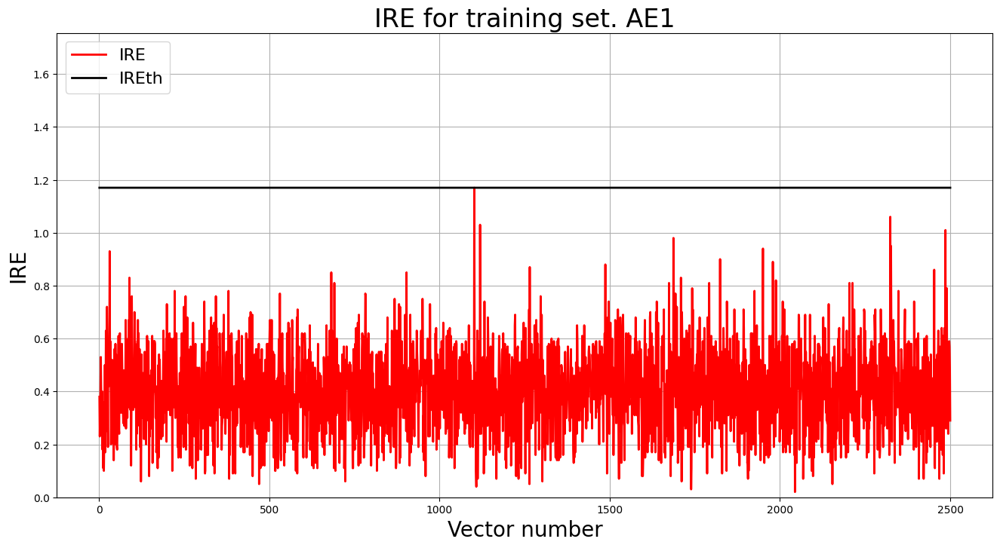

In [24]:
# Построение графика ошибки реконструкции
lib_3d.ire_plot('training', IRE1, IREth1, 'AE1')

In [25]:
print(IRE1.shape, IREth1.shape)

(2500,) ()


In [26]:
IREth1

1.17

In [27]:
# scan
x_min, x_max = data[:, 0].min() - 2, data[:, 0].max() + 1
# print(x_min, x_max)
y_min, y_max = data[:, 1].min() - 1, data[:, 1].max() + 1
# print(y_min, y_max)
z_min, z_max = data[:, 2].min() - 1, data[:, 2].max() + 1

h_x = (x_max - x_min) / 100
h_y = (y_max - y_min) / 100
h_z = (z_max - z_min) / 100
h_y = h_x
h_z = h_x
#print('ШАГ x:', h_x)
#print('ШАГ y:', h_y)
xx, yy, zz = np.meshgrid(np.arange(x_min, x_max, h_x), np.arange(y_min, y_max, h_y),np.arange(z_min, z_max, h_z))
X_plot = np.c_[xx.ravel(), yy.ravel(), zz.ravel()]

In [41]:
X_plot.shape

(828100, 3)

In [29]:
def ire_array(array1, array2):
    ire_list = []
    for index in range(array1.shape[0]):
        ire_list.append(ire(array1[index], array2[index]))
    ire_array = np.array(ire_list)
    return ire_array

In [37]:
import math

def ire(vector1, vector2):
    x = 0
    for i in range(len(vector1)):
        x += (vector2[i] - vector1[i])**2
    # !! Round to .xx
    ire = round(math.sqrt(x), 2)
    return ire

In [38]:
def predict_ae(nn, x_test, threshold):
    x_test_predicted = nn.predict(x_test)
    ire = ire_array(x_test, x_test_predicted)

    predicted_labels = (ire > threshold).astype(float)
    predicted_labels = predicted_labels.reshape((predicted_labels.shape[0], 1))
    ire = np.transpose(np.array([ire]))
    return predicted_labels, ire

In [39]:
Z, ire = predict_ae(ae1_trained, X_plot, IREth1)

25879/25879 [==============================] - 49s 2ms/step


In [40]:
Z.shape

(828100, 1)

In [55]:

X_def = np.array([0, 0, 0], ndmin=3)
for ind, ans in enumerate(Z):
  if ans == 0:
        # print(ans, ' kl= 1')
        # print(ind, len (svm_predicted_scan))
        X_def = np.append(X_def, [[X_plot[ind]]], axis=0)

    # построение областей покрытия и границ классов
X_def = np.delete(X_def, 0, axis=0)
Z = Z.reshape(xx.shape)

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [56]:
X_def

array([[[0, 0, 0]]])

In [46]:
X_plot[1]

array([-2.68939383, -1.99626955, -1.92047171])

In [48]:

X_def = np.array([0, 0], ndmin=2)
X_def

array([[0, 0]])

In [51]:
X_def = np.array([0, 0, 0], ndmin=3)
np.append(X_def, [[X_plot[1]]], axis=0)

array([[[ 0.        ,  0.        ,  0.        ]],

       [[-2.68939383, -1.99626955, -1.92047171]]])

In [33]:
Z.shape

NameError: name 'Z' is not defined

In [ ]:
X_def.shape

In [19]:
# построение областей покрытия и границ классов
# расчет характеристик качества обучения
numb_square = 30
xx, yy, zz, Z1 = lib_3d.square_calc(numb_square, data, ae1_trained, IREth1, '1', False)

25879/25879 [==============================] - 46s 2ms/step


ValueError: all the input arrays must have same number of dimensions, but the array at index 0 has 3 dimension(s) and the array at index 1 has 2 dimension(s)

(2500, 3)

In [ ]:
# обучение AE2 (взяли 5 слоев: 6 4 2 4 6)
patience = 500
ae2_trained, IRE2, IREth2 = lib.create_fit_save_ae(data_el,'out/AE2.h5','out/AE2_ire_th.txt',
5000, True, patience)

Задать архитектуру автокодировщиков или использовать архитектуру по умолчанию? (1/2): 1
Задайте количество скрытых слоёв (нечетное число) : 5
Задайте архитектуру скрытых слоёв автокодировщика, например, в виде 3 1 3 : 6 4 2 4 6
Epoch 1/5000
1/1 [==============================] - 2s 2s/step - loss: 0.1629
Epoch 2/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.1607
Epoch 3/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.1585
Epoch 4/5000
1/1 [==============================] - 0s 15ms/step - loss: 0.1564
Epoch 5/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.1543
Epoch 6/5000
1/1 [==============================] - 0s 14ms/step - loss: 0.1522
Epoch 7/5000
1/1 [==============================] - 0s 11ms/step - loss: 0.1501
Epoch 8/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.1481
Epoch 9/5000
1/1 [==============================] - 0s 15ms/step - loss: 0.1461
Epoch 10/5000
1/1 [==============================] - 0

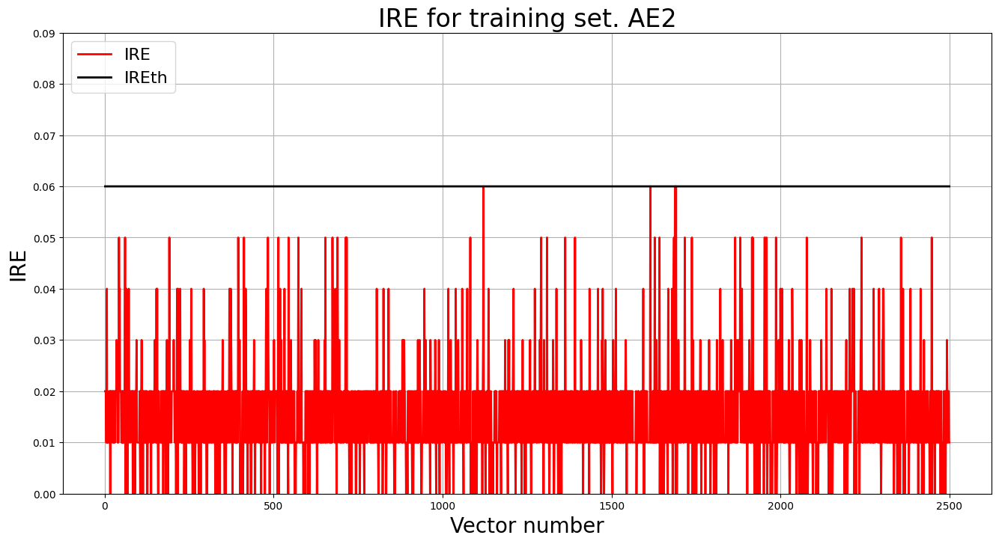

In [ ]:
# Построение графика ошибки реконструкции
lib.ire_plot('training', IRE2, IREth2, 'AE2')

288/288 [==============================] - 1s 3ms/step


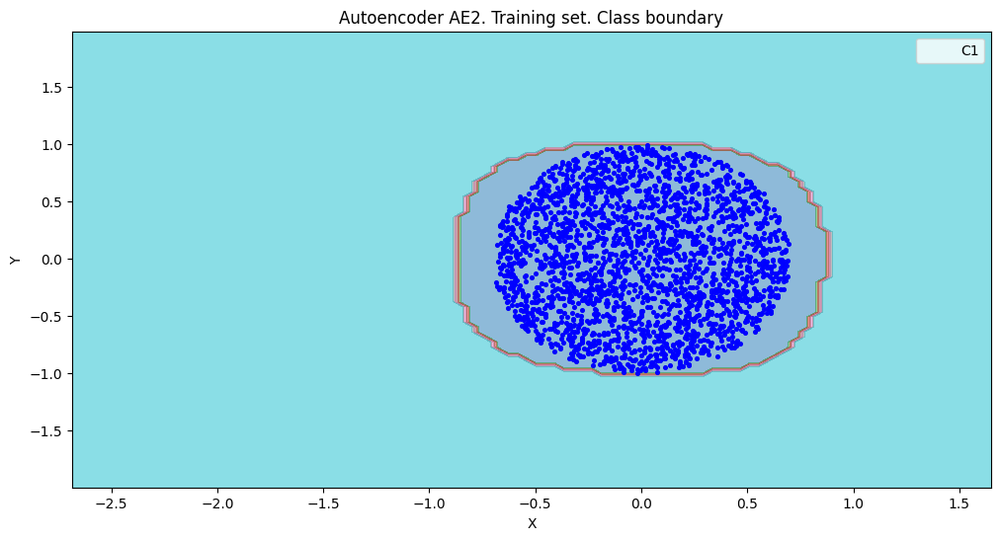

amount:  133
amount_ae:  179


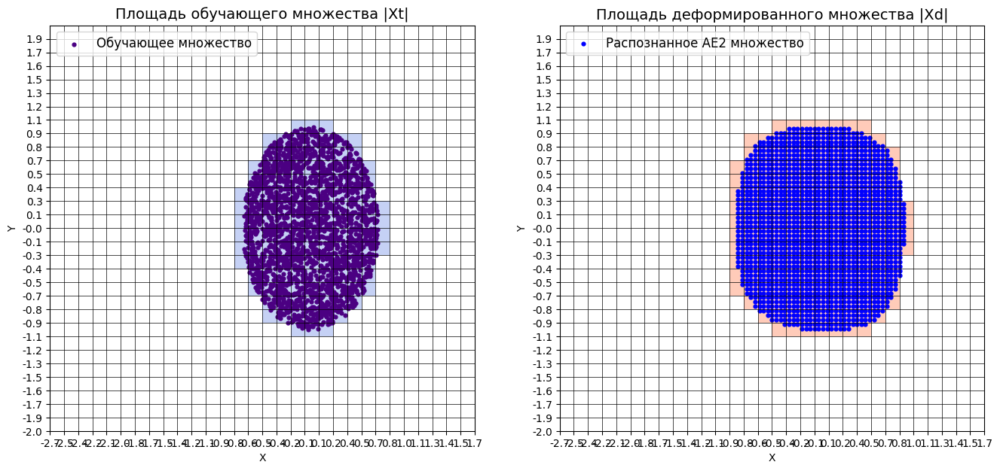

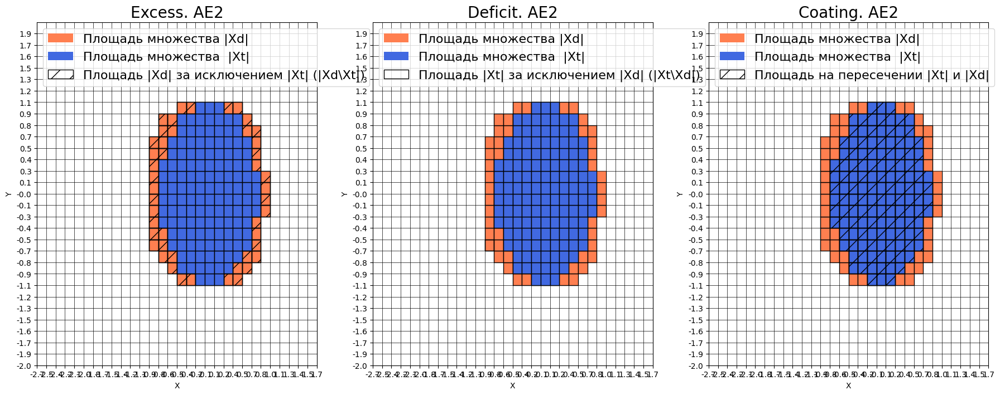


Оценка качества AE2
IDEAL = 0. Excess:  0.3458646616541353
IDEAL = 0. Deficit:  0.0
IDEAL = 1. Coating:  1.0
summa:  1.0
IDEAL = 1. Extrapolation precision (Approx):  0.7430167597765364




In [ ]:
# построение областей покрытия и границ классов
# расчет характеристик качества обучения
numb_square = 30
xx, yy, Z2 = lib.square_calc(numb_square, data_el, ae2_trained, IREth2, '2', True)

In [ ]:
# обучение AE3 (7 слоев: 8 6 4 2 4 6 8)
patience = 500
ae3_trained, IRE3, IREth3 = lib.create_fit_save_ae(data_el,'out/AE3.h5','out/AE3_ire_th.txt',
5000, True, patience)

Задать архитектуру автокодировщиков или использовать архитектуру по умолчанию? (1/2): 1
Задайте количество скрытых слоёв (нечетное число) : 7
Задайте архитектуру скрытых слоёв автокодировщика, например, в виде 3 1 3 : 8 6 4 2 4 6 8
Epoch 1/5000
1/1 [==============================] - 3s 3s/step - loss: 0.2182
Epoch 2/5000
1/1 [==============================] - 0s 18ms/step - loss: 0.2143
Epoch 3/5000
1/1 [==============================] - 0s 24ms/step - loss: 0.2105
Epoch 4/5000
1/1 [==============================] - 0s 17ms/step - loss: 0.2070
Epoch 5/5000
1/1 [==============================] - 0s 17ms/step - loss: 0.2036
Epoch 6/5000
1/1 [==============================] - 0s 18ms/step - loss: 0.2004
Epoch 7/5000
1/1 [==============================] - 0s 14ms/step - loss: 0.1974
Epoch 8/5000
1/1 [==============================] - 0s 13ms/step - loss: 0.1946
Epoch 9/5000
1/1 [==============================] - 0s 16ms/step - loss: 0.1919
Epoch 10/5000
1/1 [==============================]

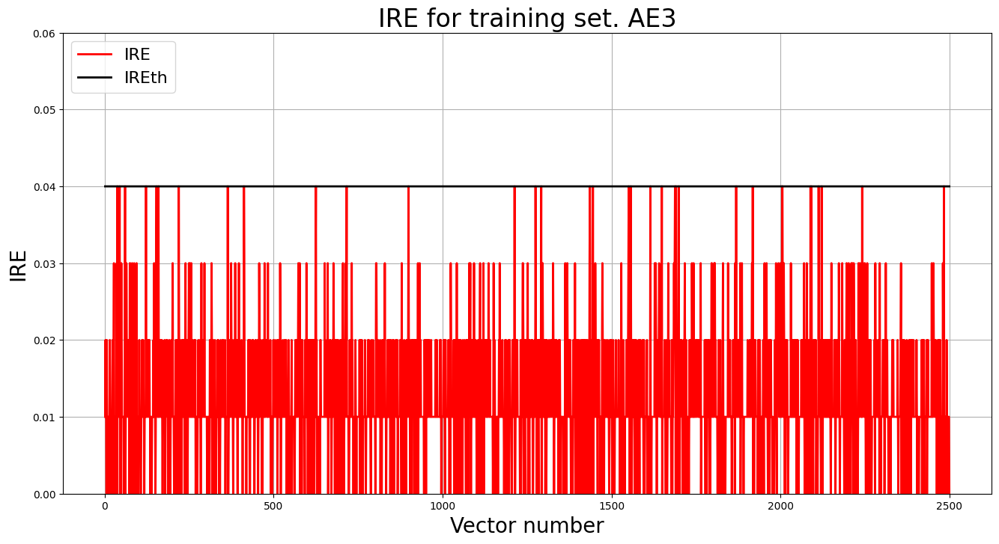

In [ ]:
# Построение графика ошибки реконструкции
lib.ire_plot('training', IRE3, IREth3, 'AE3')

288/288 [==============================] - 1s 5ms/step


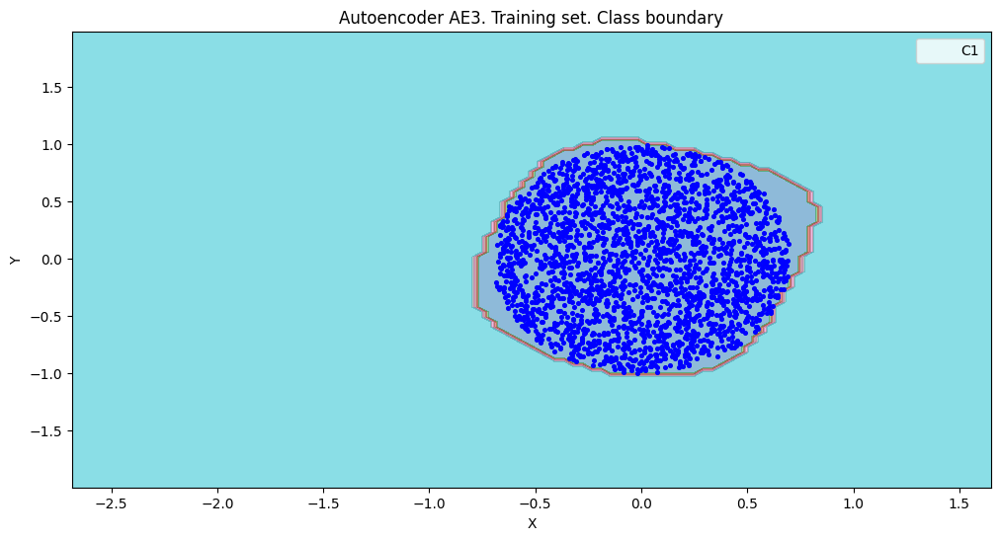

amount:  133
amount_ae:  148


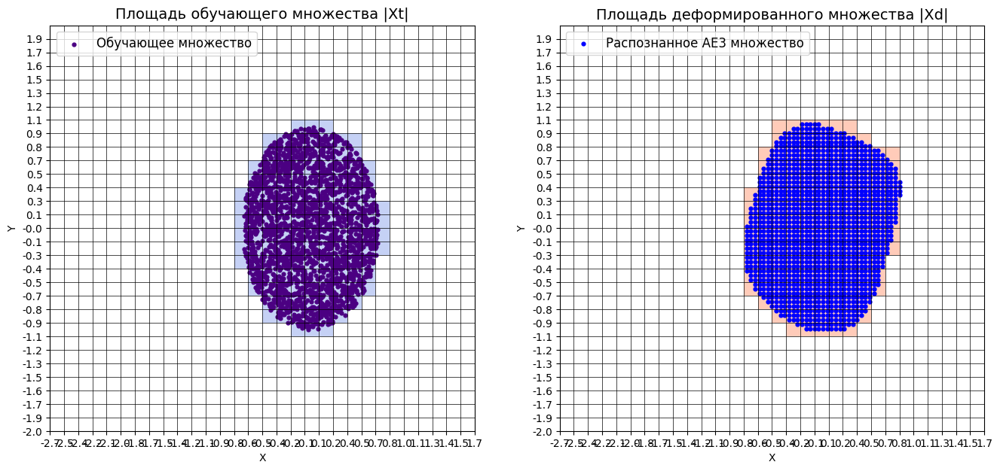

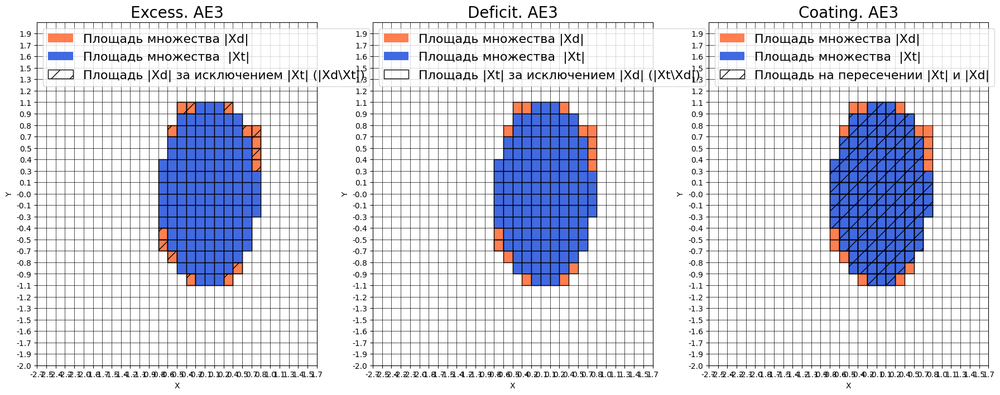


Оценка качества AE3
IDEAL = 0. Excess:  0.11278195488721804
IDEAL = 0. Deficit:  0.0
IDEAL = 1. Coating:  1.0
summa:  1.0
IDEAL = 1. Extrapolation precision (Approx):  0.8986486486486487




In [ ]:
# построение областей покрытия и границ классов
# расчет характеристик качества обучения
numb_square = 30
xx, yy, Z3 = lib.square_calc(numb_square, data_el, ae3_trained, IREth3, '3', True)

In [ ]:
# обучение AE4 (9 слоев: 10 8 6 4 2 4 6 8 10)
patience = 500
ae4_trained, IRE4, IREth4 = lib.create_fit_save_ae(data_el,'out/AE4.h5','out/AE4_ire_th.txt',
5000, True, patience)

Задать архитектуру автокодировщиков или использовать архитектуру по умолчанию? (1/2): 1
Задайте количество скрытых слоёв (нечетное число) : 9
Задайте архитектуру скрытых слоёв автокодировщика, например, в виде 3 1 3 : 10 8 6 4 2 4 6 8 10
Epoch 1/5000
1/1 [==============================] - 2s 2s/step - loss: 0.2748
Epoch 2/5000
1/1 [==============================] - 0s 13ms/step - loss: 0.2678
Epoch 3/5000
1/1 [==============================] - 0s 16ms/step - loss: 0.2611
Epoch 4/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.2548
Epoch 5/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.2488
Epoch 6/5000
1/1 [==============================] - 0s 14ms/step - loss: 0.2431
Epoch 7/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.2377
Epoch 8/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.2325
Epoch 9/5000
1/1 [==============================] - 0s 14ms/step - loss: 0.2275
Epoch 10/5000
1/1 [=========================

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


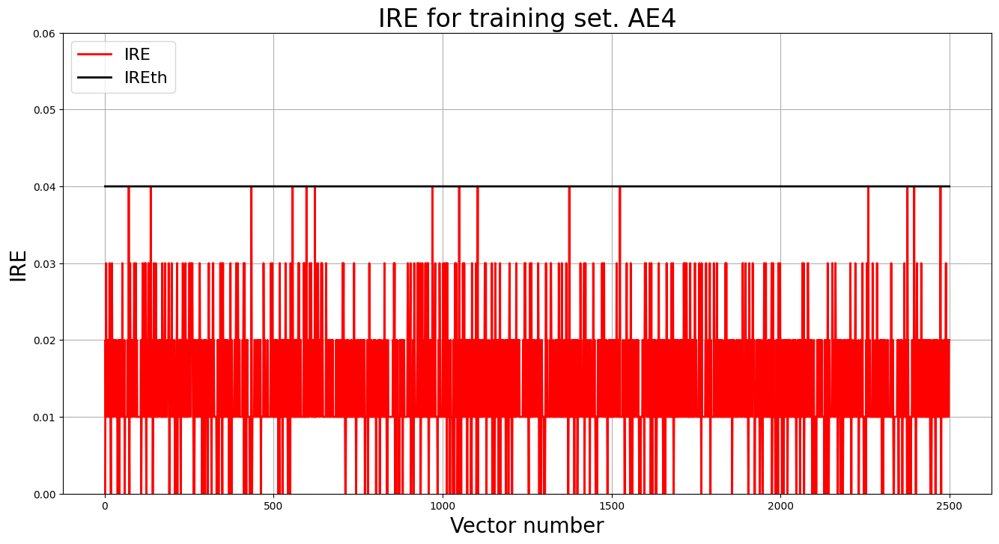

In [ ]:
# Построение графика ошибки реконструкции
lib.ire_plot('training', IRE4, IREth4, 'AE4')

285/285 [==============================] - 1s 2ms/step


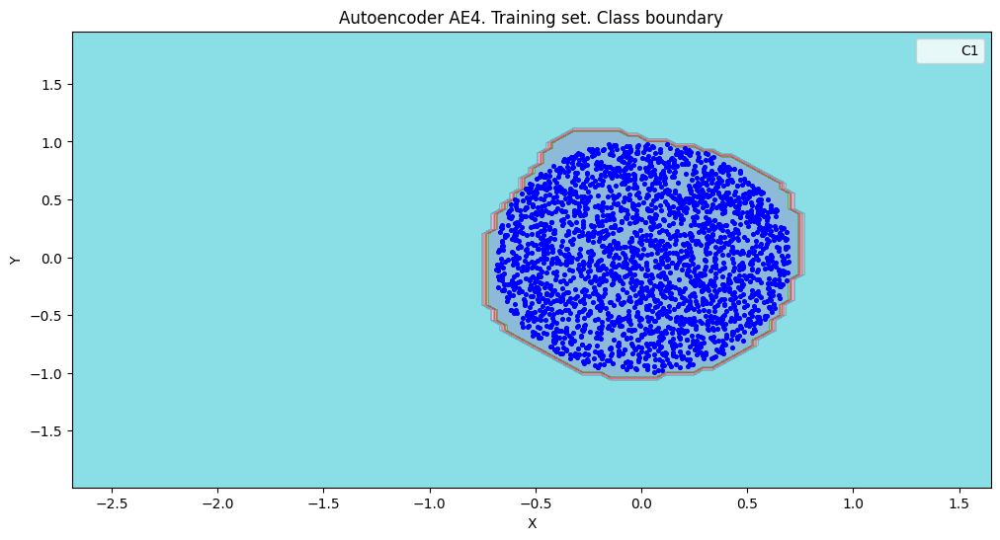

amount:  137
amount_ae:  151


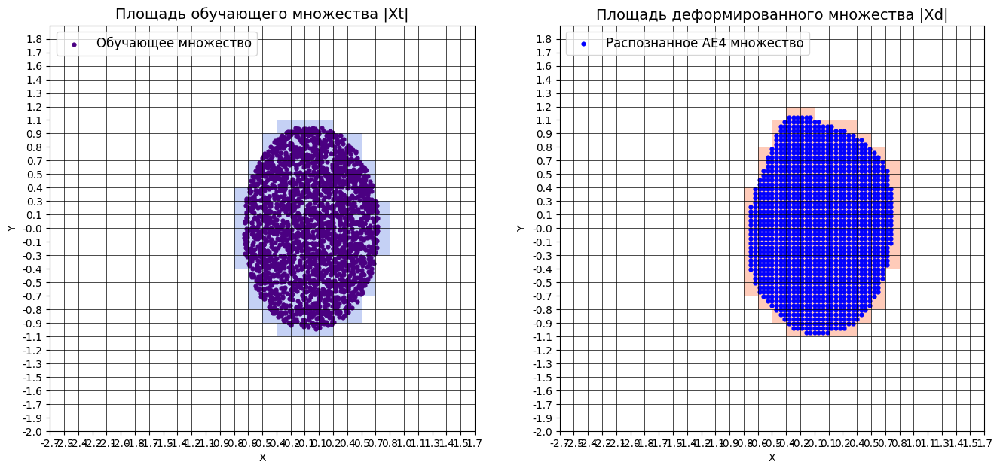

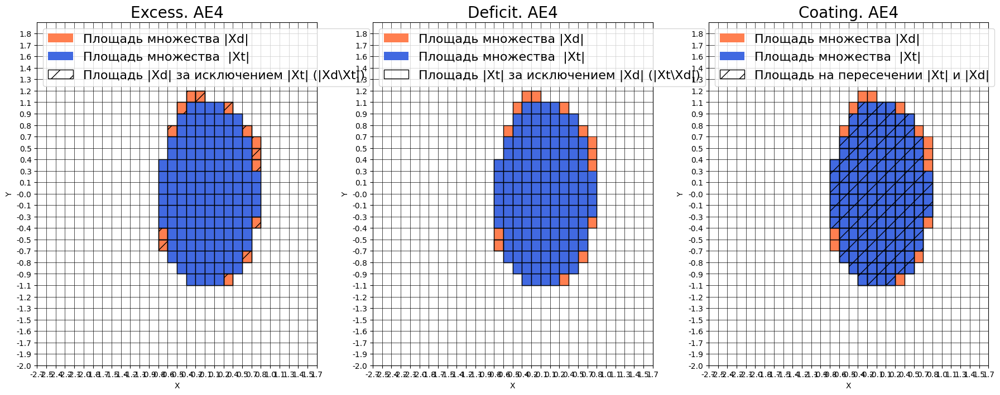


Оценка качества AE4
IDEAL = 0. Excess:  0.10218978102189781
IDEAL = 0. Deficit:  0.0
IDEAL = 1. Coating:  1.0
summa:  1.0
IDEAL = 1. Extrapolation precision (Approx):  0.9072847682119205




In [ ]:
# построение областей покрытия и границ классов
# расчет характеристик качества обучения
numb_square = 30
xx, yy, Z4 = lib.square_calc(numb_square, data_el, ae4_trained, IREth4, '4', True)

In [ ]:
# обучение AE1h3 Взяли 3 слоя, но теперь не 4 2 4, а 4 3 4)
patience = 500
ae11_trained, IRE11, IREth11 = lib.create_fit_save_ae(data_el,'out/AE11.h5','out/AE11_ire_th.txt',
5000, True, patience)

Выходные данные были обрезаны до нескольких последних строк (5000).
1/1 [==============================] - 0s 9ms/step - loss: 0.0552
Epoch 398/5000
1/1 [==============================] - 0s 9ms/step - loss: 0.0549
Epoch 399/5000
1/1 [==============================] - 0s 9ms/step - loss: 0.0546
Epoch 400/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0543
Epoch 401/5000
1/1 [==============================] - 0s 16ms/step - loss: 0.0541
Epoch 402/5000
1/1 [==============================] - 0s 13ms/step - loss: 0.0538
Epoch 403/5000
1/1 [==============================] - 0s 15ms/step - loss: 0.0534
Epoch 404/5000
1/1 [==============================] - 0s 19ms/step - loss: 0.0531
Epoch 405/5000
1/1 [==============================] - 0s 19ms/step - loss: 0.0528
Epoch 406/5000
1/1 [==============================] - 0s 24ms/step - loss: 0.0525
Epoch 407/5000
1/1 [==============================] - 0s 22ms/step - loss: 0.0521
Epoch 408/5000
1/1 [============================

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


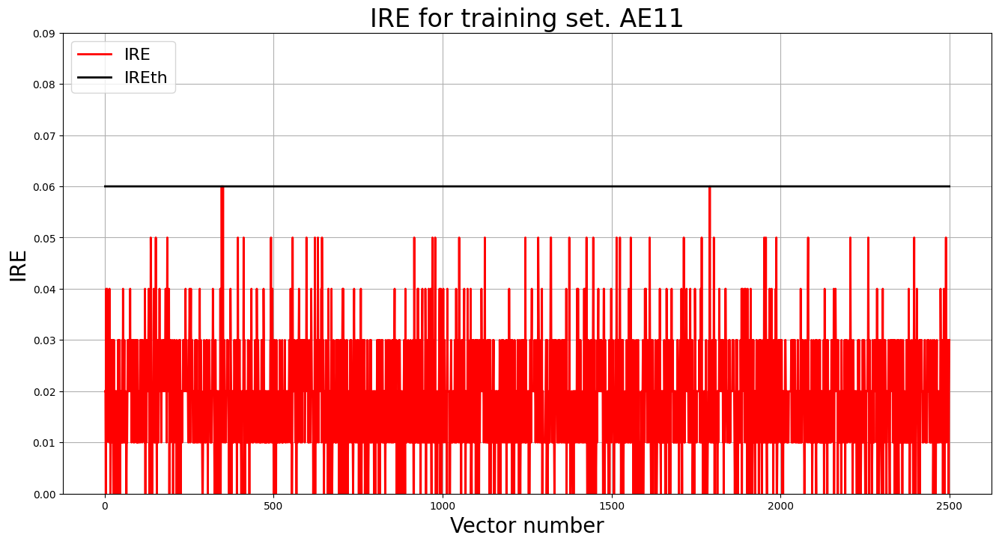

In [ ]:
# Построение графика ошибки реконструкции
lib.ire_plot('training', IRE11, IREth11, 'AE11')

285/285 [==============================] - 1s 3ms/step


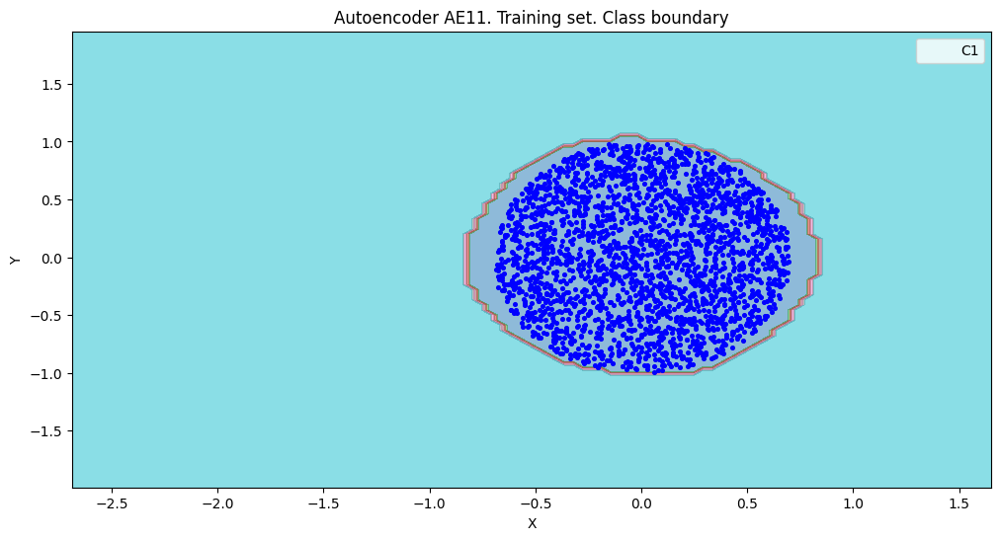

amount:  137
amount_ae:  158


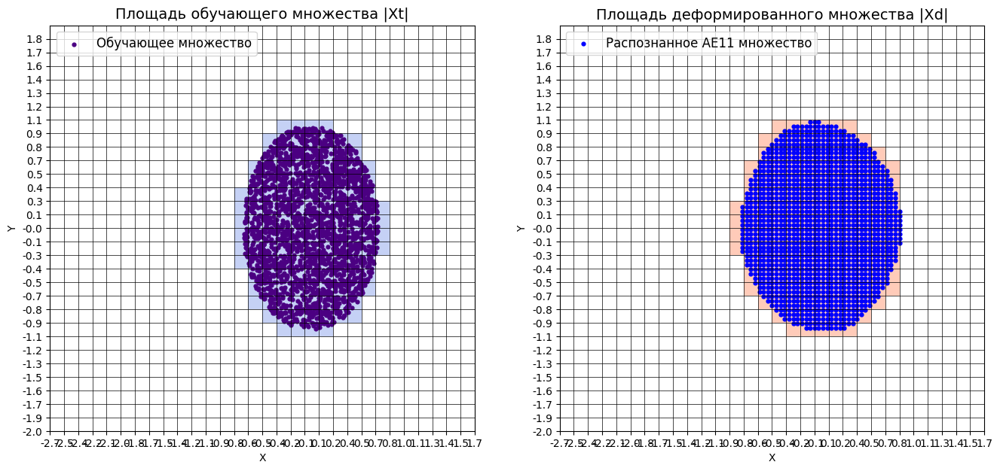

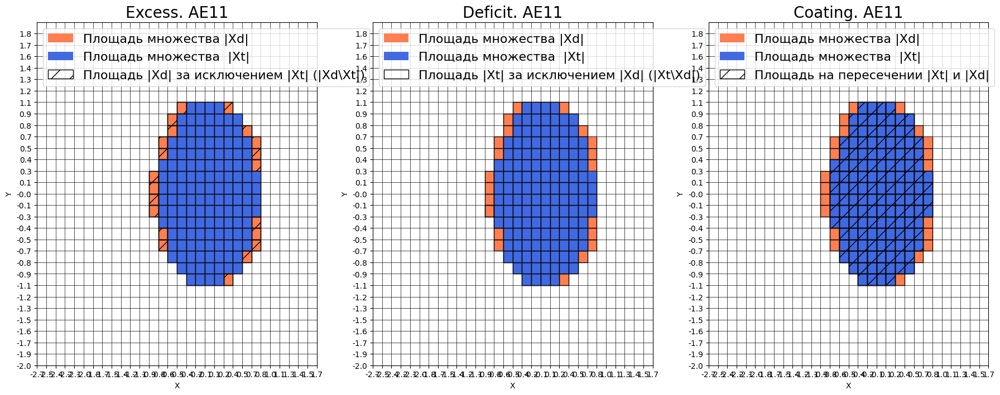


Оценка качества AE11
IDEAL = 0. Excess:  0.15328467153284672
IDEAL = 0. Deficit:  0.0
IDEAL = 1. Coating:  1.0
summa:  1.0
IDEAL = 1. Extrapolation precision (Approx):  0.8670886075949367




In [ ]:
# построение областей покрытия и границ классов
# расчет характеристик качества обучения
numb_square = 30
xx, yy, Z11 = lib.square_calc(numb_square, data_el, ae11_trained, IREth11, '11', True)

In [ ]:
# обучение AE1.2 Взяли 3 слоев, но теперь 4 1 4
patience = 500
ae12_trained, IRE12, IREth12 = lib.create_fit_save_ae(data_el,'out/AE12.h5','out/AE12_ire_th.txt',
5000, True, patience)

Выходные данные были обрезаны до нескольких последних строк (5000).
1/1 [==============================] - 0s 14ms/step - loss: 0.0632
Epoch 2503/5000
1/1 [==============================] - 0s 10ms/step - loss: 0.0632
Epoch 2504/5000
1/1 [==============================] - 0s 14ms/step - loss: 0.0632
Epoch 2505/5000
1/1 [==============================] - 0s 14ms/step - loss: 0.0632
Epoch 2506/5000
1/1 [==============================] - 0s 9ms/step - loss: 0.0632
Epoch 2507/5000
1/1 [==============================] - 0s 9ms/step - loss: 0.0632
Epoch 2508/5000
1/1 [==============================] - 0s 9ms/step - loss: 0.0632
Epoch 2509/5000
1/1 [==============================] - 0s 10ms/step - loss: 0.0632
Epoch 2510/5000
1/1 [==============================] - 0s 9ms/step - loss: 0.0632
Epoch 2511/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0632
Epoch 2512/5000
1/1 [==============================] - 0s 9ms/step - loss: 0.0632
Epoch 2513/5000
1/1 [===================

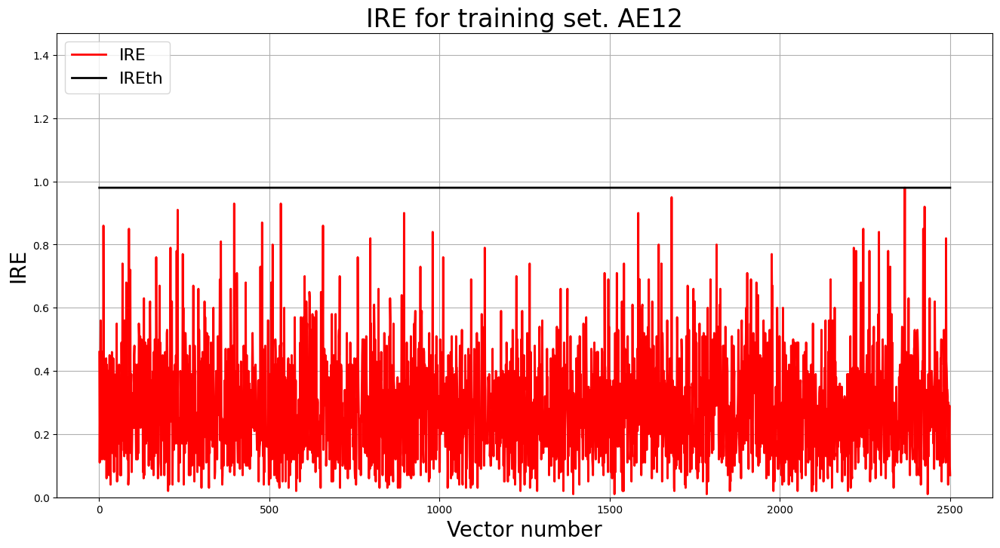

In [ ]:
# Построение графика ошибки реконструкции
lib.ire_plot('training', IRE12, IREth12, 'AE12')

285/285 [==============================] - 1s 2ms/step


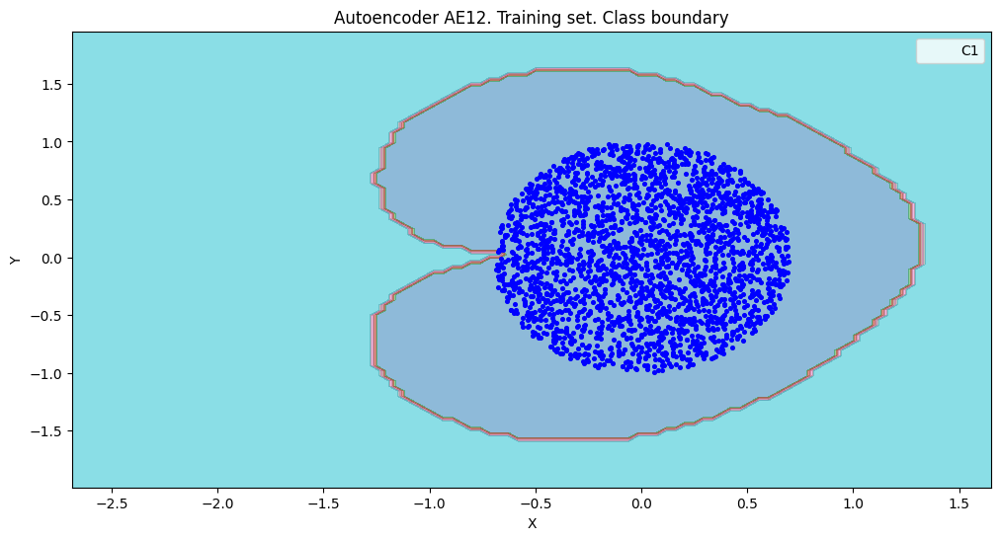

amount:  137
amount_ae:  364


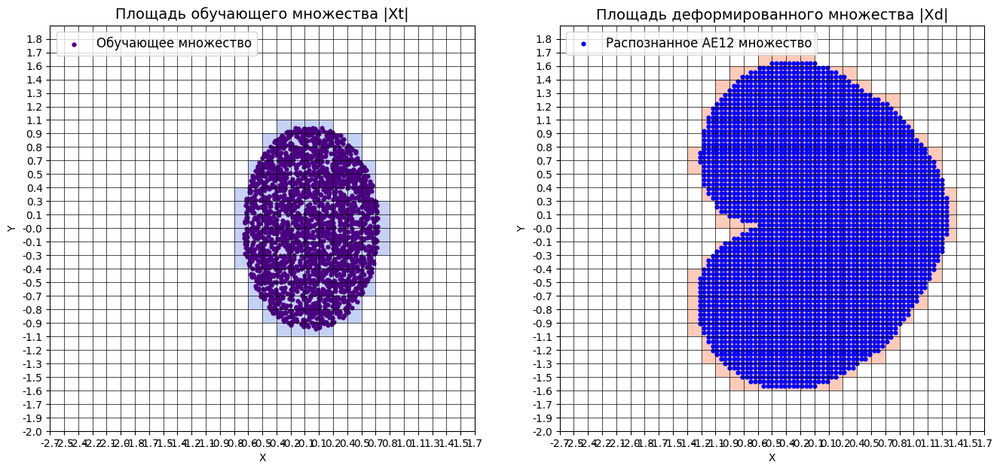

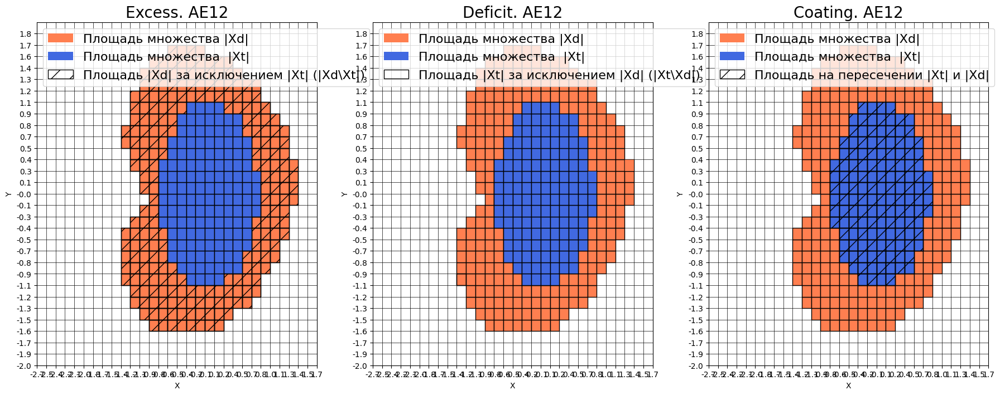


Оценка качества AE12
IDEAL = 0. Excess:  1.6569343065693432
IDEAL = 0. Deficit:  0.0
IDEAL = 1. Coating:  1.0
summa:  1.0
IDEAL = 1. Extrapolation precision (Approx):  0.3763736263736263




In [ ]:
# построение областей покрытия и границ классов
# расчет характеристик качества обучения
numb_square = 30
xx, yy, Z12 = lib.square_calc(numb_square, data_el, ae12_trained, IREth12, '12', True)

In [ ]:
# обучение AE13 Взяли 5 слоев, теперь 6 4 3 4 6
patience = 500
ae13_trained, IRE13, IREth13 = lib.create_fit_save_ae(data_el,'out/AE13.h5','out/AE13_ire_th.txt',
5000, True, patience)

Выходные данные были обрезаны до нескольких последних строк (5000).
Epoch 698/5000
1/1 [==============================] - 0s 16ms/step - loss: 0.0021
Epoch 699/5000
1/1 [==============================] - 0s 13ms/step - loss: 0.0021
Epoch 700/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0021
Epoch 701/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0021
Epoch 702/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0021
Epoch 703/5000
1/1 [==============================] - 0s 13ms/step - loss: 0.0021
Epoch 704/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0021
Epoch 705/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0021
Epoch 706/5000
1/1 [==============================] - 0s 14ms/step - loss: 0.0021
Epoch 707/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0021
Epoch 708/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0021
Epoch 709/5000
1/1 [==========

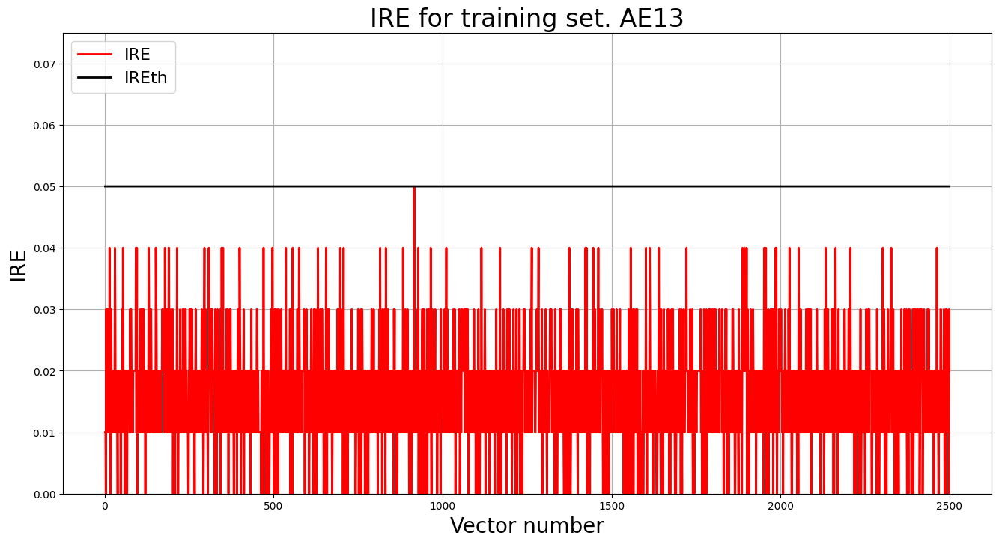

In [ ]:
# Построение графика ошибки реконструкции
lib.ire_plot('training', IRE13, IREth13, 'AE13')

285/285 [==============================] - 1s 4ms/step


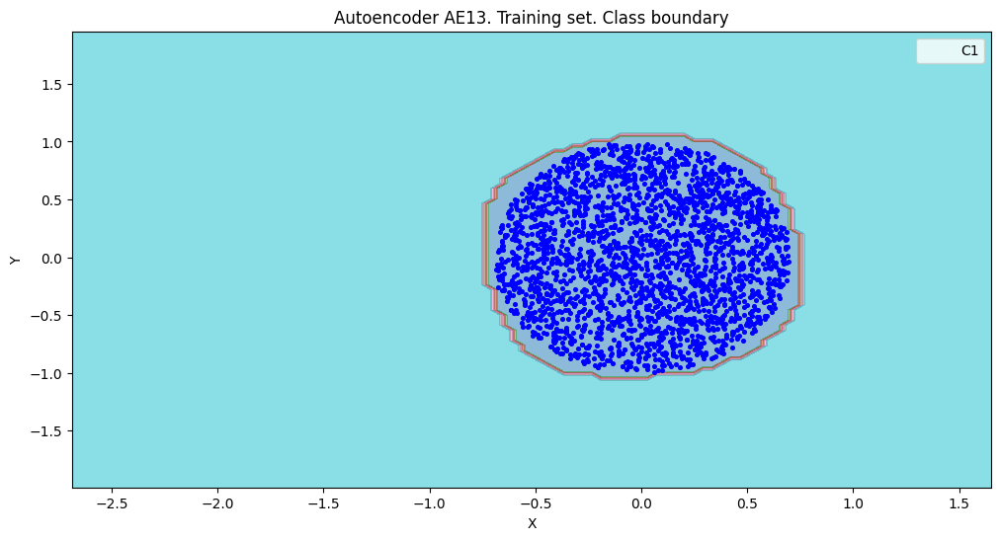

amount:  137
amount_ae:  153


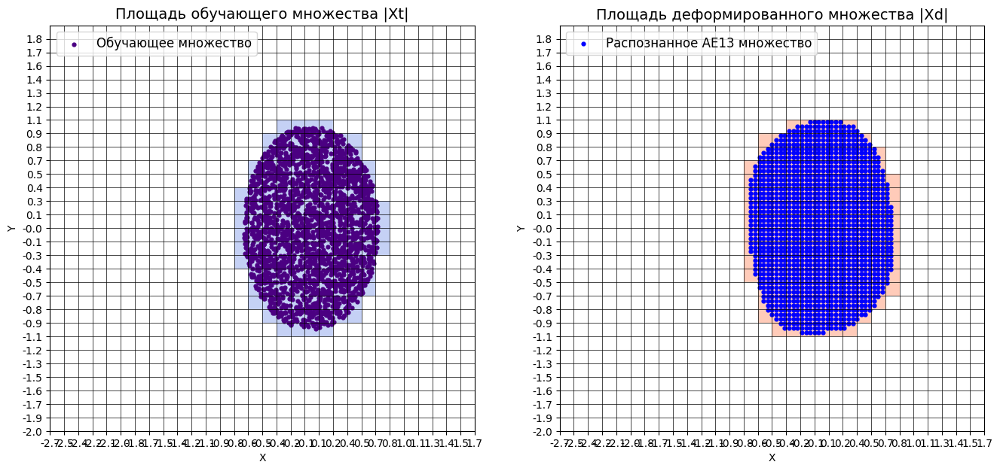

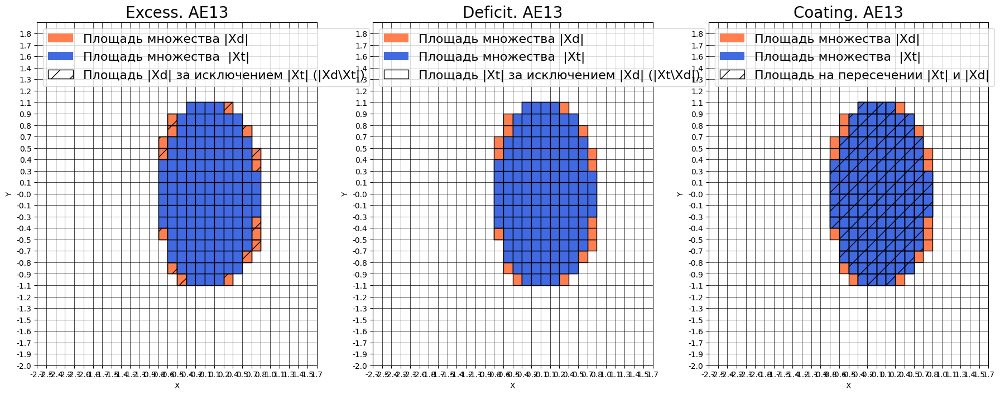


Оценка качества AE13
IDEAL = 0. Excess:  0.11678832116788321
IDEAL = 0. Deficit:  0.0
IDEAL = 1. Coating:  1.0
summa:  1.0
IDEAL = 1. Extrapolation precision (Approx):  0.8954248366013071




In [ ]:
# построение областей покрытия и границ классов
# расчет характеристик качества обучения
numb_square = 30
xx, yy, Z13 = lib.square_calc(numb_square, data_el, ae13_trained, IREth13, '13', True)

In [ ]:
# обучение AE14 Взяли 5 слоев, теперь 6 4 1 4 6
patience = 500
ae14_trained, IRE14, IREth14 = lib.create_fit_save_ae(data_el,'out/AE14.h5','out/AE14_ire_th.txt',
5000, True, patience)

Выходные данные были обрезаны до нескольких последних строк (5000).
1/1 [==============================] - 0s 11ms/step - loss: 0.0367
Epoch 2503/5000
1/1 [==============================] - 0s 15ms/step - loss: 0.0367
Epoch 2504/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0367
Epoch 2505/5000
1/1 [==============================] - 0s 18ms/step - loss: 0.0367
Epoch 2506/5000
1/1 [==============================] - 0s 13ms/step - loss: 0.0367
Epoch 2507/5000
1/1 [==============================] - 0s 11ms/step - loss: 0.0367
Epoch 2508/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0367
Epoch 2509/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0367
Epoch 2510/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0367
Epoch 2511/5000
1/1 [==============================] - 0s 11ms/step - loss: 0.0367
Epoch 2512/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0367
Epoch 2513/5000
1/1 [==============

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


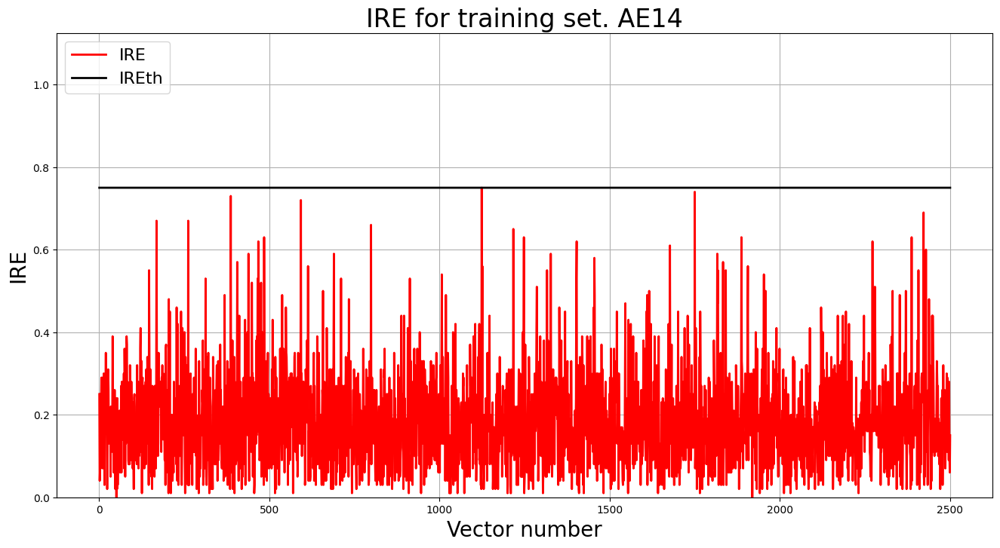

In [ ]:
# Построение графика ошибки реконструкции
lib.ire_plot('training', IRE14, IREth14, 'AE14')

285/285 [==============================] - 1s 3ms/step


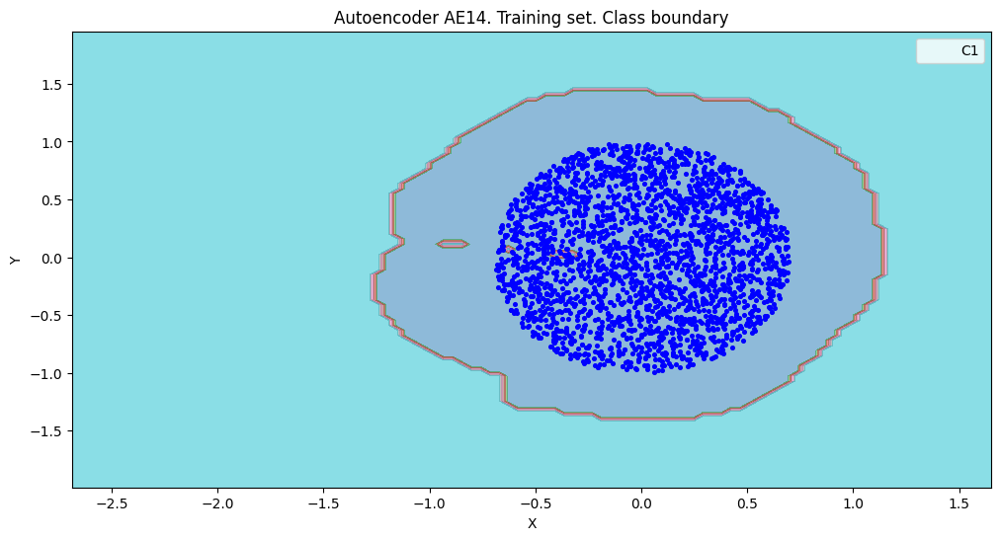

amount:  137
amount_ae:  305


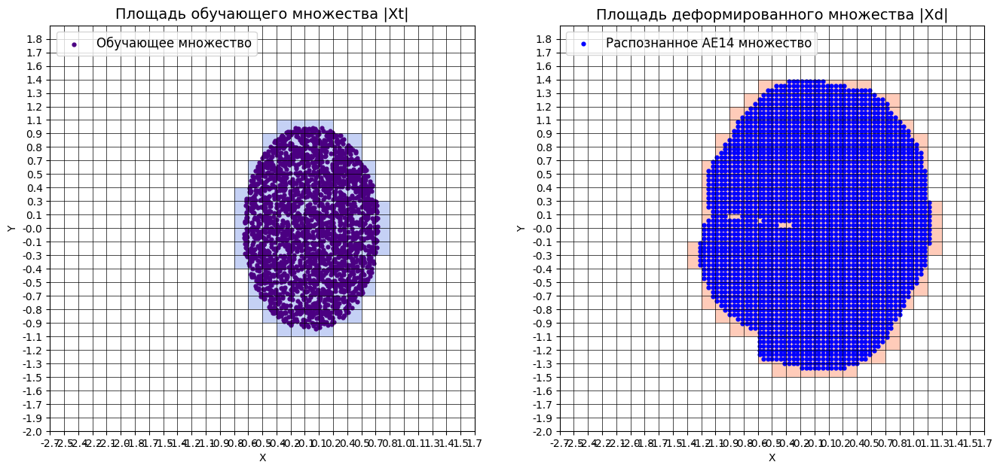

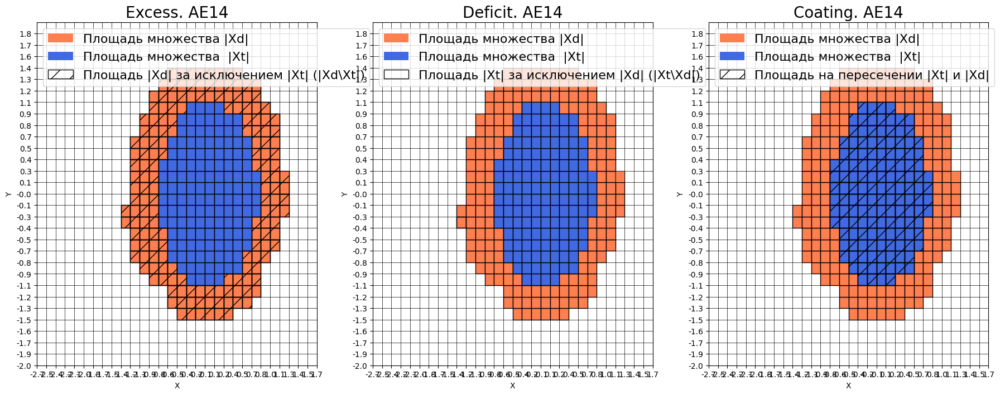


Оценка качества AE14
IDEAL = 0. Excess:  1.2262773722627738
IDEAL = 0. Deficit:  0.0
IDEAL = 1. Coating:  1.0
summa:  1.0
IDEAL = 1. Extrapolation precision (Approx):  0.4491803278688524




In [ ]:
# построение областей покрытия и границ классов
# расчет характеристик качества обучения
numb_square = 30
xx, yy, Z14 = lib.square_calc(numb_square, data_el, ae14_trained, IREth14, '14', True)

In [ ]:
# обучение AE15 Взяли 3 слоев, было 4 2 4 теперь сделаем 3 2 3
patience = 500
ae15_trained, IRE15, IREth15 = lib.create_fit_save_ae(data_el,'out/AE15.h5','out/AE15_ire_th.txt',
5000, True, patience)

Выходные данные были обрезаны до нескольких последних строк (5000).
Epoch 1934/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0014
Epoch 1935/5000
1/1 [==============================] - 0s 13ms/step - loss: 0.0014
Epoch 1936/5000
1/1 [==============================] - 0s 15ms/step - loss: 0.0014
Epoch 1937/5000
1/1 [==============================] - 0s 14ms/step - loss: 0.0014
Epoch 1938/5000
1/1 [==============================] - 0s 15ms/step - loss: 0.0014
Epoch 1939/5000
1/1 [==============================] - 0s 15ms/step - loss: 0.0014
Epoch 1940/5000
1/1 [==============================] - 0s 14ms/step - loss: 0.0014
Epoch 1941/5000
1/1 [==============================] - 0s 14ms/step - loss: 0.0014
Epoch 1942/5000
1/1 [==============================] - 0s 14ms/step - loss: 0.0014
Epoch 1943/5000
1/1 [==============================] - 0s 11ms/step - loss: 0.0014
Epoch 1944/5000
1/1 [==============================] - 0s 13ms/step - loss: 0.0014
Epoch 1945/5000
1/1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


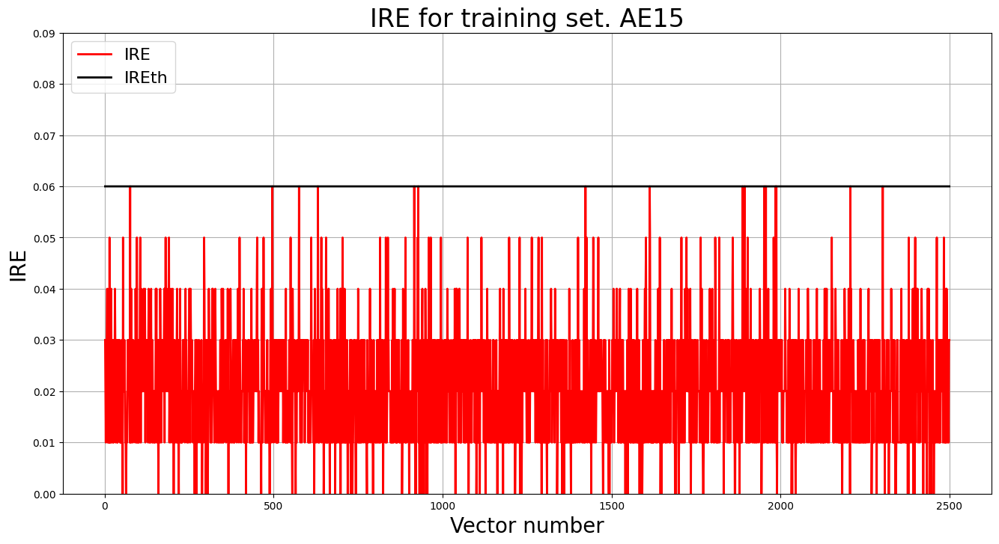

In [ ]:
# Построение графика ошибки реконструкции
lib.ire_plot('training', IRE15, IREth15, 'AE15')

285/285 [==============================] - 1s 2ms/step


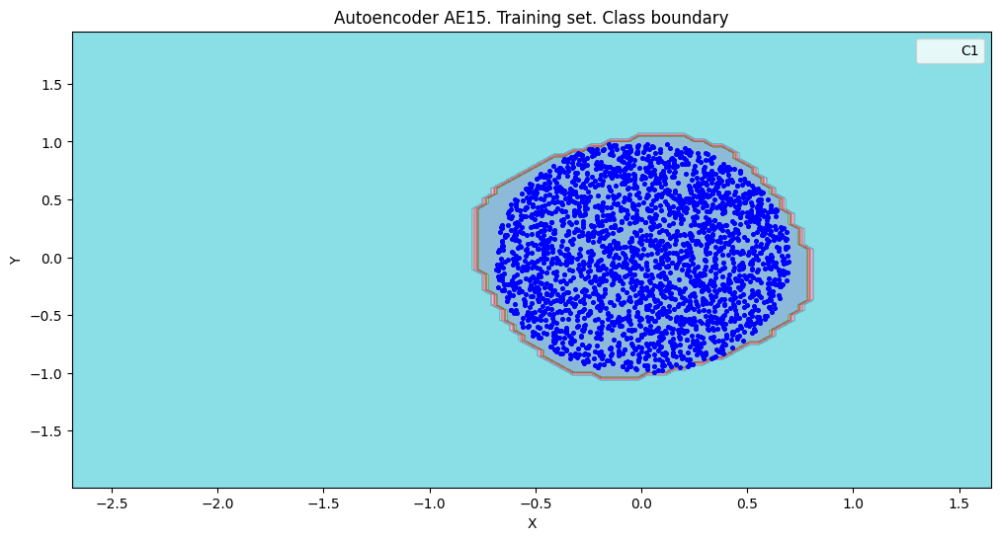

amount:  137
amount_ae:  149


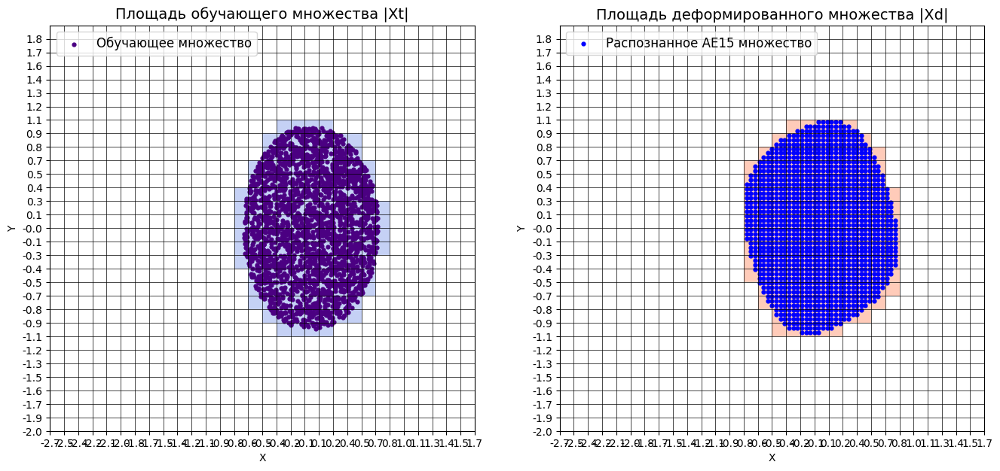

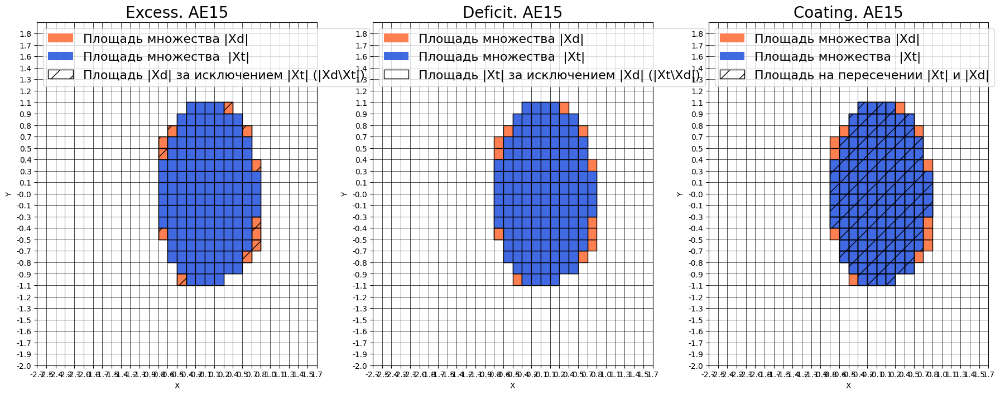


Оценка качества AE15
IDEAL = 0. Excess:  0.08759124087591241
IDEAL = 0. Deficit:  0.0
IDEAL = 1. Coating:  1.0
summa:  1.0
IDEAL = 1. Extrapolation precision (Approx):  0.919463087248322




In [ ]:
# построение областей покрытия и границ классов
# расчет характеристик качества обучения
numb_square = 30
xx, yy, Z15 = lib.square_calc(numb_square, data_el, ae15_trained, IREth15, '15', True)

In [ ]:
# обучение AE16 (3 скрытых слоя: 3 2 3) но берем с минимальным порогом
patience = 500
ae16_trained, IRE16, IREth16 = lib_min.create_fit_save_ae(data_el,'out/AE16.h5','out/AE16_ire_th.txt',
5000, True, patience)


Выходные данные были обрезаны до нескольких последних строк (5000).
1/1 [==============================] - 0s 12ms/step - loss: 0.0017
Epoch 2503/5000
1/1 [==============================] - 0s 13ms/step - loss: 0.0017
Epoch 2504/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0017
Epoch 2505/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0017
Epoch 2506/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0017
Epoch 2507/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0016
Epoch 2508/5000
1/1 [==============================] - 0s 9ms/step - loss: 0.0016
Epoch 2509/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0016
Epoch 2510/5000
1/1 [==============================] - 0s 13ms/step - loss: 0.0016
Epoch 2511/5000
1/1 [==============================] - 0s 13ms/step - loss: 0.0016
Epoch 2512/5000
1/1 [==============================] - 0s 11ms/step - loss: 0.0016
Epoch 2513/5000
1/1 [===============

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


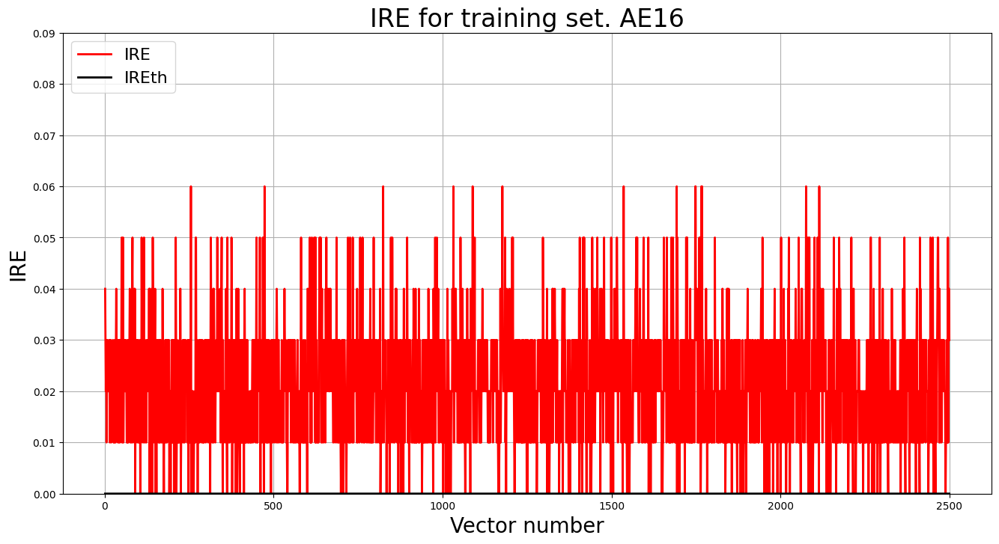

In [ ]:
# Построение графика ошибки реконструкции
lib_min.ire_plot('training', IRE16, IREth16, 'AE16')

285/285 [==============================] - 0s 1ms/step


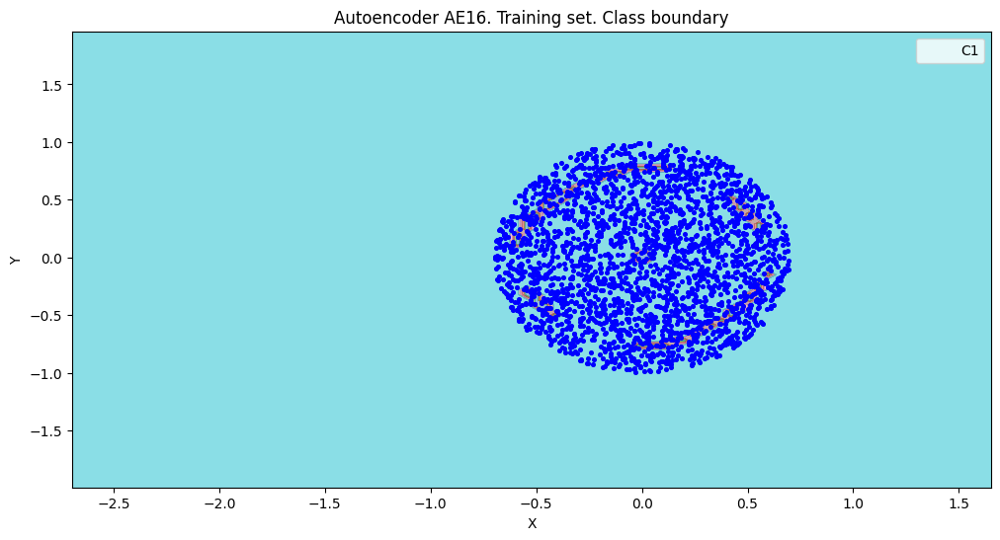

amount:  135
amount_ae:  26


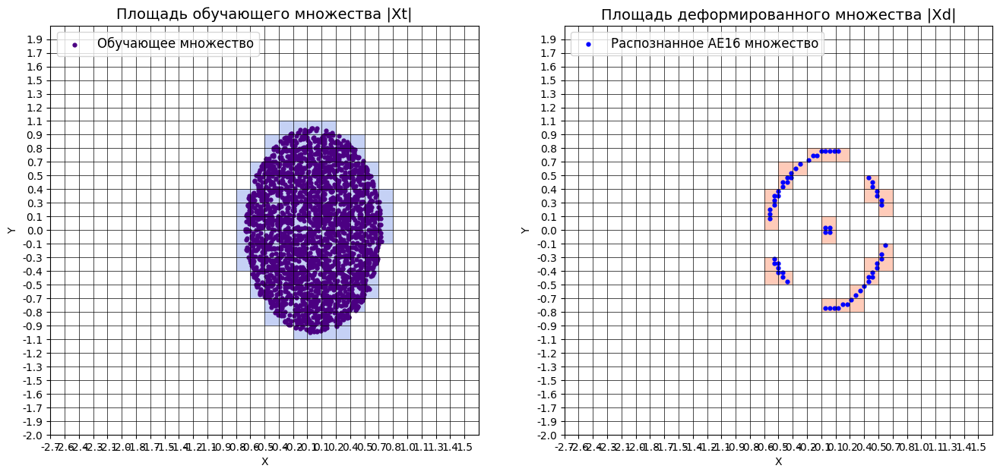

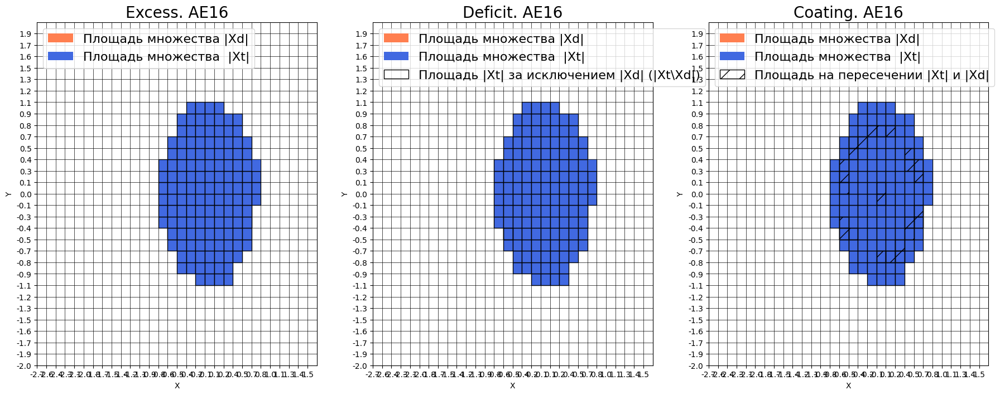


Оценка качества AE16
IDEAL = 0. Excess:  0.0
IDEAL = 0. Deficit:  0.8074074074074075
IDEAL = 1. Coating:  0.1925925925925926
summa:  1.0
IDEAL = 1. Extrapolation precision (Approx):  5.192307692307692




In [ ]:
# построение областей покрытия и границ классов
# расчет характеристик качества обучения
numb_square = 30
xx, yy, Z16 = lib_min.square_calc(numb_square, data_el, ae16_trained, IREth16, '16', True)

In [ ]:
# обучение AE17 (3 скрытых слоя: 3 2 3) но берем со средним порогом
patience = 500
ae17_trained, IRE17, IREth17 = lib_mean.create_fit_save_ae(data_el,'out/AE17.h5','out/AE17_ire_th.txt',
5000, True, patience)

Выходные данные были обрезаны до нескольких последних строк (5000).
Epoch 1373/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0013
Epoch 1374/5000
1/1 [==============================] - 0s 13ms/step - loss: 0.0013
Epoch 1375/5000
1/1 [==============================] - 0s 14ms/step - loss: 0.0013
Epoch 1376/5000
1/1 [==============================] - 0s 11ms/step - loss: 0.0013
Epoch 1377/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0013
Epoch 1378/5000
1/1 [==============================] - 0s 11ms/step - loss: 0.0013
Epoch 1379/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0013
Epoch 1380/5000
1/1 [==============================] - 0s 13ms/step - loss: 0.0013
Epoch 1381/5000
1/1 [==============================] - 0s 14ms/step - loss: 0.0013
Epoch 1382/5000
1/1 [==============================] - 0s 10ms/step - loss: 0.0013
Epoch 1383/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0013
Epoch 1384/5000
1/1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


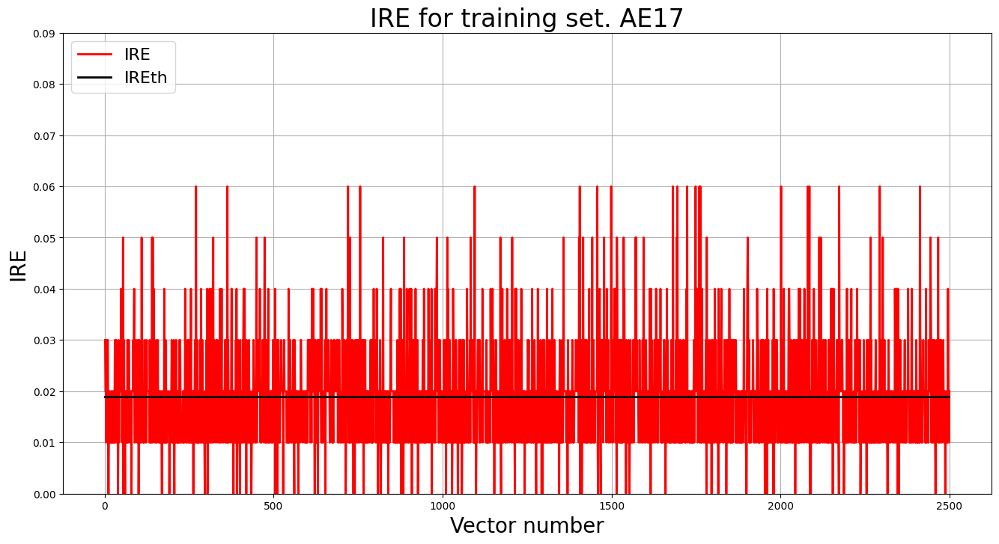

In [ ]:
# Построение графика ошибки реконструкции
lib_mean.ire_plot('training', IRE17, IREth17, 'AE17')

285/285 [==============================] - 1s 3ms/step


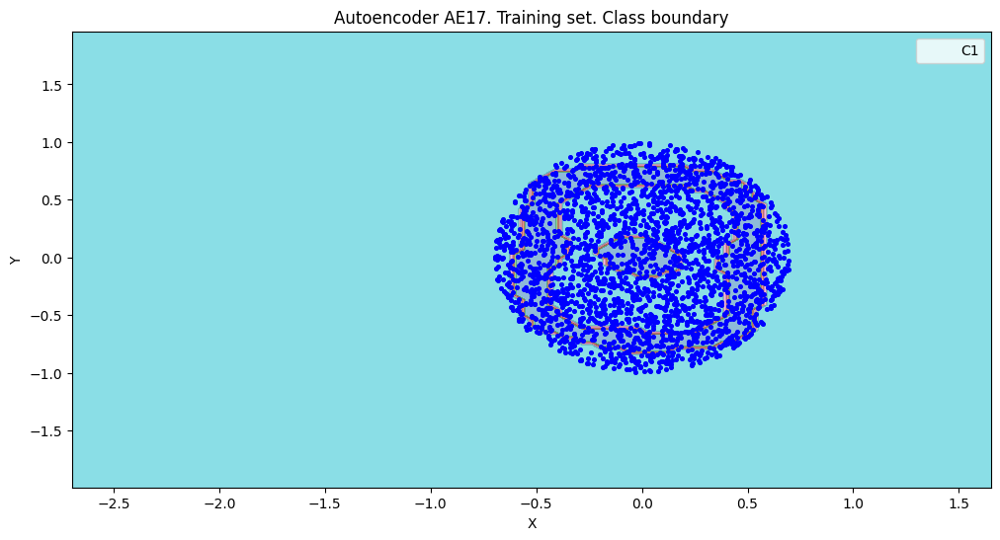

amount:  135
amount_ae:  74


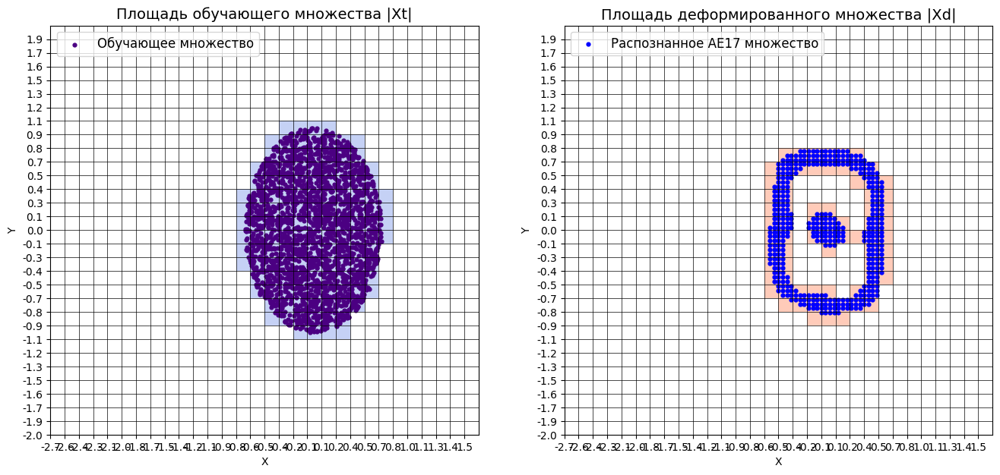

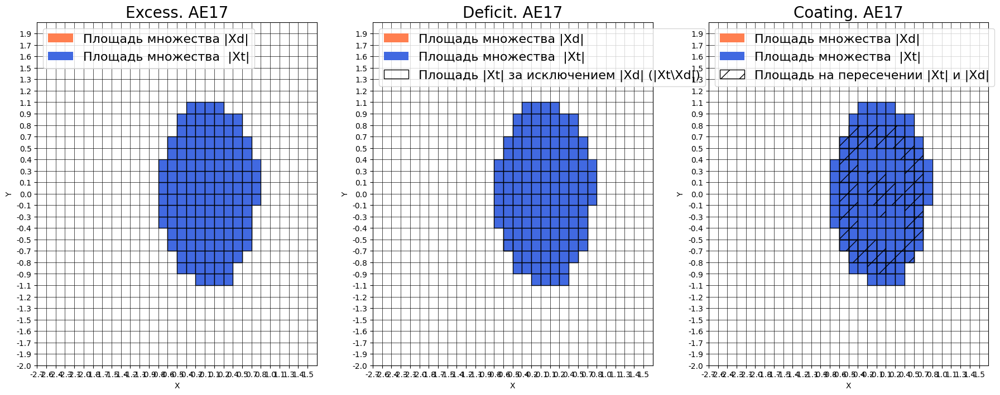


Оценка качества AE17
IDEAL = 0. Excess:  0.0
IDEAL = 0. Deficit:  0.45185185185185184
IDEAL = 1. Coating:  0.5481481481481482
summa:  1.0
IDEAL = 1. Extrapolation precision (Approx):  1.8243243243243243




In [ ]:
# построение областей покрытия и границ классов
# расчет характеристик качества обучения
numb_square = 30
xx, yy, Z17 = lib_mean.square_calc(numb_square, data_el, ae17_trained, IREth17, '17', True)

In [ ]:
a = [1, 2, 5, 7 ,3]
aa = np.array(a)

b = 4

predicted_labels = (aa > b).astype(float)
    #predicted_labels = predicted_labels.reshape((predicted_labels.shape[0], 1))
    #ire = np.transpose(np.array([ire]))
predicted_labels


array([0., 0., 1., 1., 0.])

In [ ]:
# обучение AE18 (3 скрытых слоя: 4 1 4) но берем с минимальным порогом
patience = 500
ae18_trained, IRE18, IREth18 = lib_min.create_fit_save_ae(data_el,'out/AE18.h5','out/AE18_ire_th.txt',
5000, True, patience)

Выходные данные были обрезаны до нескольких последних строк (5000).
1/1 [==============================] - 0s 10ms/step - loss: 0.0612
Epoch 2503/5000
1/1 [==============================] - 0s 16ms/step - loss: 0.0612
Epoch 2504/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0612
Epoch 2505/5000
1/1 [==============================] - 0s 13ms/step - loss: 0.0612
Epoch 2506/5000
1/1 [==============================] - 0s 11ms/step - loss: 0.0612
Epoch 2507/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0612
Epoch 2508/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0612
Epoch 2509/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0612
Epoch 2510/5000
1/1 [==============================] - 0s 13ms/step - loss: 0.0612
Epoch 2511/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0612
Epoch 2512/5000
1/1 [==============================] - 0s 11ms/step - loss: 0.0612
Epoch 2513/5000
1/1 [==============

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


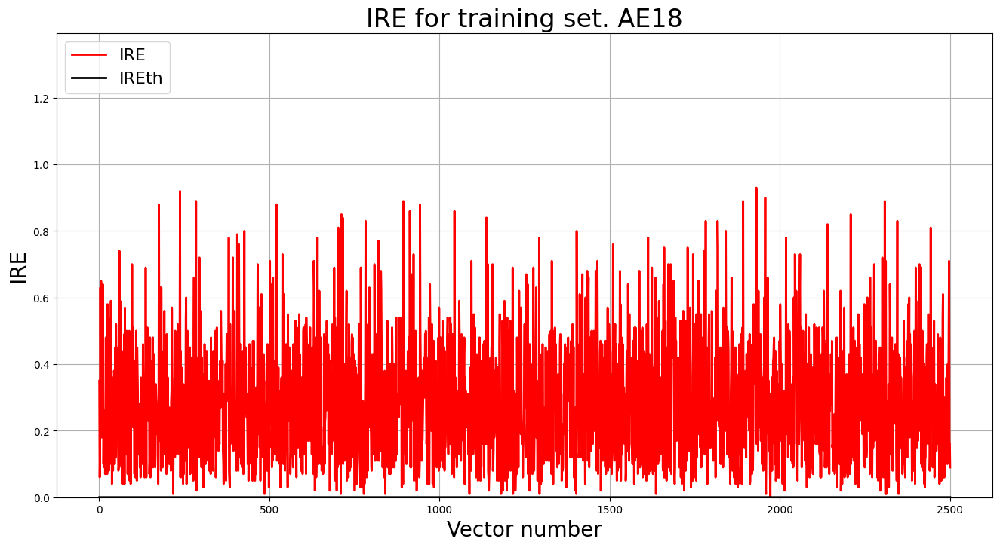

In [ ]:
# Построение графика ошибки реконструкции
lib_min.ire_plot('training', IRE18, IREth18, 'AE18')

285/285 [==============================] - 1s 2ms/step


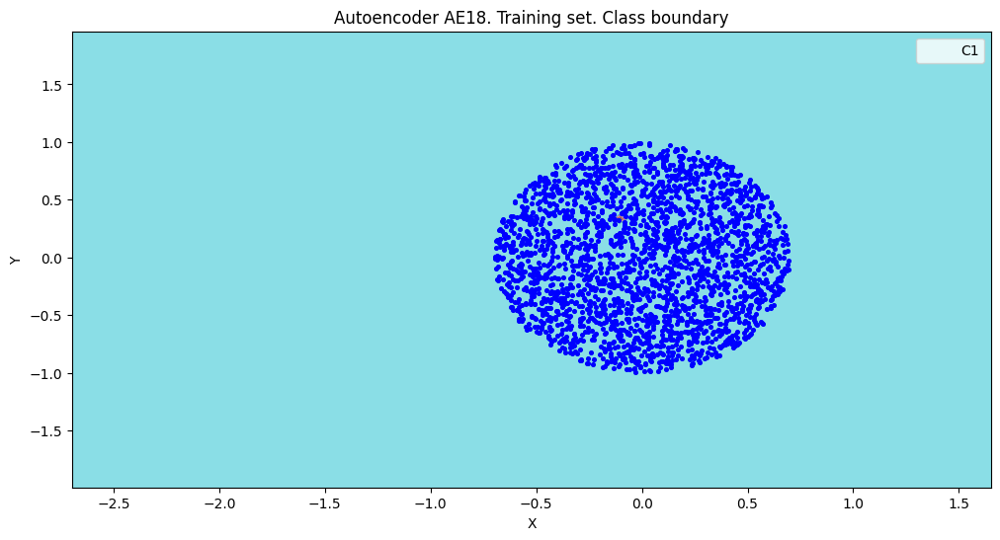

amount:  135
amount_ae:  1


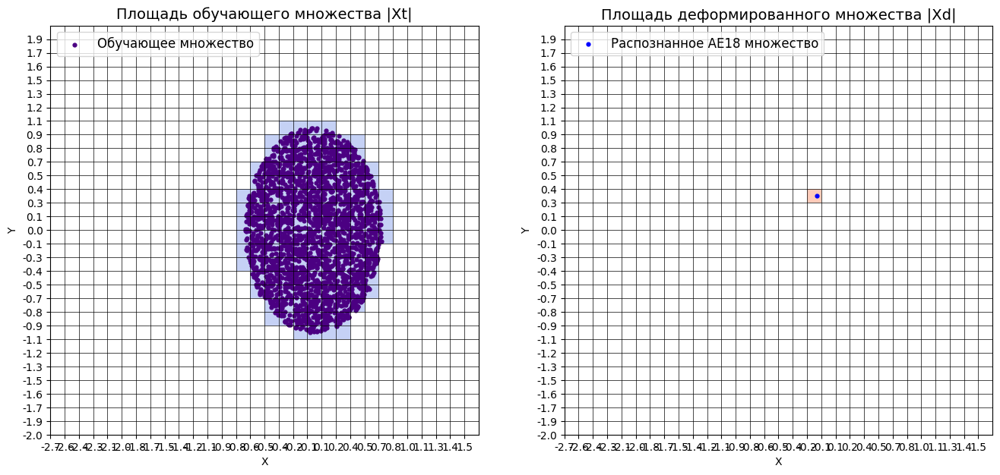

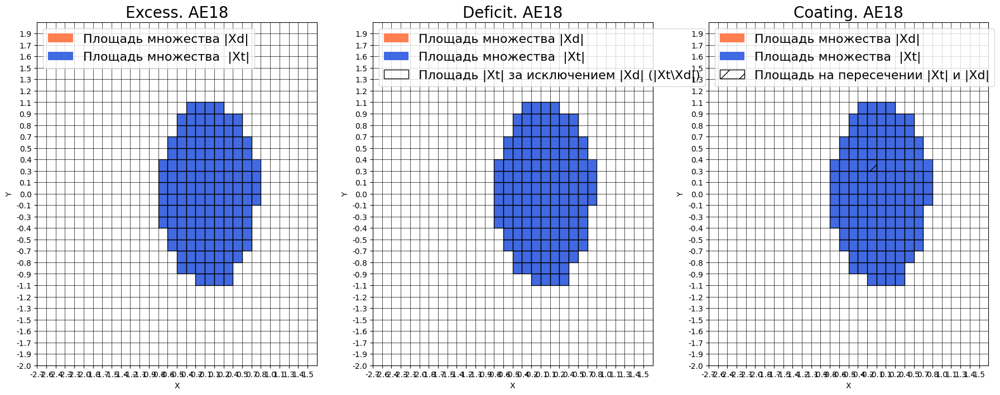


Оценка качества AE18
IDEAL = 0. Excess:  0.0
IDEAL = 0. Deficit:  0.9925925925925926
IDEAL = 1. Coating:  0.007407407407407408
summa:  1.0
IDEAL = 1. Extrapolation precision (Approx):  135.0




In [ ]:
# построение областей покрытия и границ классов
# расчет характеристик качества обучения
numb_square = 30
xx, yy, Z18 = lib_min.square_calc(numb_square, data_el, ae18_trained, IREth18, '18', True)

In [ ]:
# обучение AE19 (3 скрытых слоя: 4 1 4) но берем со средним порогом
patience = 500
ae19_trained, IRE19, IREth19 = lib_mean.create_fit_save_ae(data_el,'out/AE19.h5','out/AE19_ire_th.txt',
5000, True, patience)

Задать архитектуру автокодировщиков или использовать архитектуру по умолчанию? (1/2): 1
Задайте количество скрытых слоёв (нечетное число) : 3
Задайте архитектуру скрытых слоёв автокодировщика, например, в виде 3 1 3 : 4 1 4
Epoch 1/5000
1/1 [==============================] - 1s 981ms/step - loss: 0.1875
Epoch 2/5000
1/1 [==============================] - 0s 10ms/step - loss: 0.1873
Epoch 3/5000
1/1 [==============================] - 0s 9ms/step - loss: 0.1871
Epoch 4/5000
1/1 [==============================] - 0s 10ms/step - loss: 0.1868
Epoch 5/5000
1/1 [==============================] - 0s 11ms/step - loss: 0.1866
Epoch 6/5000
1/1 [==============================] - 0s 10ms/step - loss: 0.1864
Epoch 7/5000
1/1 [==============================] - 0s 11ms/step - loss: 0.1862
Epoch 8/5000
1/1 [==============================] - 0s 10ms/step - loss: 0.1860
Epoch 9/5000
1/1 [==============================] - 0s 10ms/step - loss: 0.1858
Epoch 10/5000
1/1 [==============================] - 0s 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


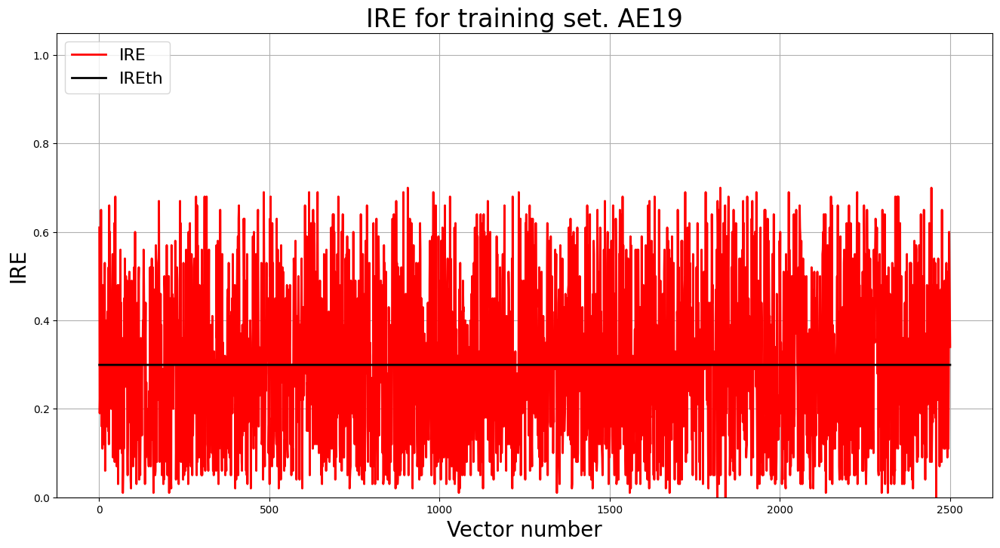

In [ ]:
# Построение графика ошибки реконструкции
lib_mean.ire_plot('training', IRE19, IREth19, 'AE19')

285/285 [==============================] - 0s 1ms/step


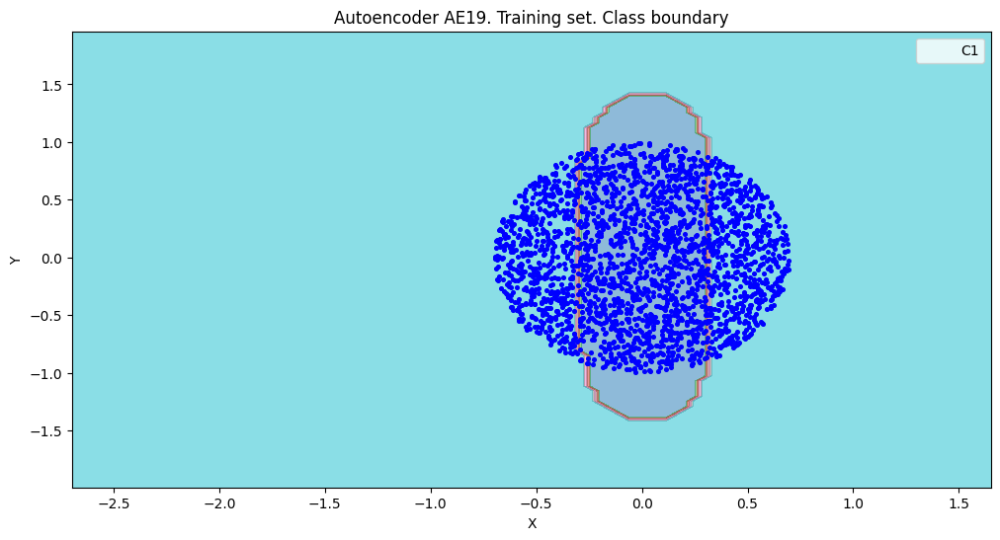

amount:  135
amount_ae:  104


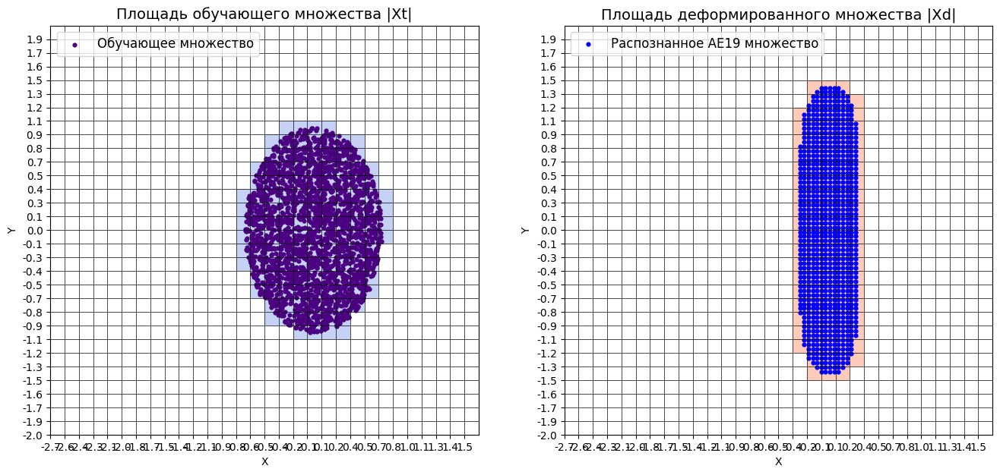

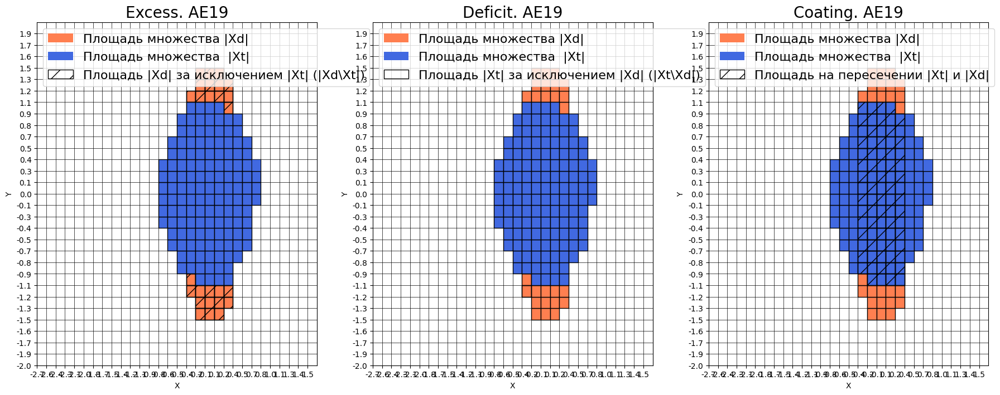


Оценка качества AE19
IDEAL = 0. Excess:  0.1925925925925926
IDEAL = 0. Deficit:  0.4222222222222222
IDEAL = 1. Coating:  0.5777777777777777
summa:  1.0
IDEAL = 1. Extrapolation precision (Approx):  1.298076923076923




In [ ]:
# построение областей покрытия и границ классов
# расчет характеристик качества обучения
numb_square = 30
xx, yy, Z19 = lib_min.square_calc(numb_square, data_el, ae19_trained, IREth19, '19', True)

In [ ]:
# обучение AE20 Взяли 5 слоев, теперь 6 4 1 4 6 и минимальный порог
patience = 500
ae20_trained, IRE20, IREth20 = lib_min.create_fit_save_ae(data_el,'out/AE20.h5','out/AE20_ire_th.txt',
5000, True, patience)

Выходные данные были обрезаны до нескольких последних строк (5000).
1/1 [==============================] - 0s 17ms/step - loss: 0.0473
Epoch 2503/5000
1/1 [==============================] - 0s 16ms/step - loss: 0.0473
Epoch 2504/5000
1/1 [==============================] - 0s 16ms/step - loss: 0.0473
Epoch 2505/5000
1/1 [==============================] - 0s 17ms/step - loss: 0.0472
Epoch 2506/5000
1/1 [==============================] - 0s 19ms/step - loss: 0.0472
Epoch 2507/5000
1/1 [==============================] - 0s 15ms/step - loss: 0.0472
Epoch 2508/5000
1/1 [==============================] - 0s 12ms/step - loss: 0.0472
Epoch 2509/5000
1/1 [==============================] - 0s 19ms/step - loss: 0.0471
Epoch 2510/5000
1/1 [==============================] - 0s 15ms/step - loss: 0.0471
Epoch 2511/5000
1/1 [==============================] - 0s 22ms/step - loss: 0.0471
Epoch 2512/5000
1/1 [==============================] - 0s 19ms/step - loss: 0.0471
Epoch 2513/5000
1/1 [==============

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


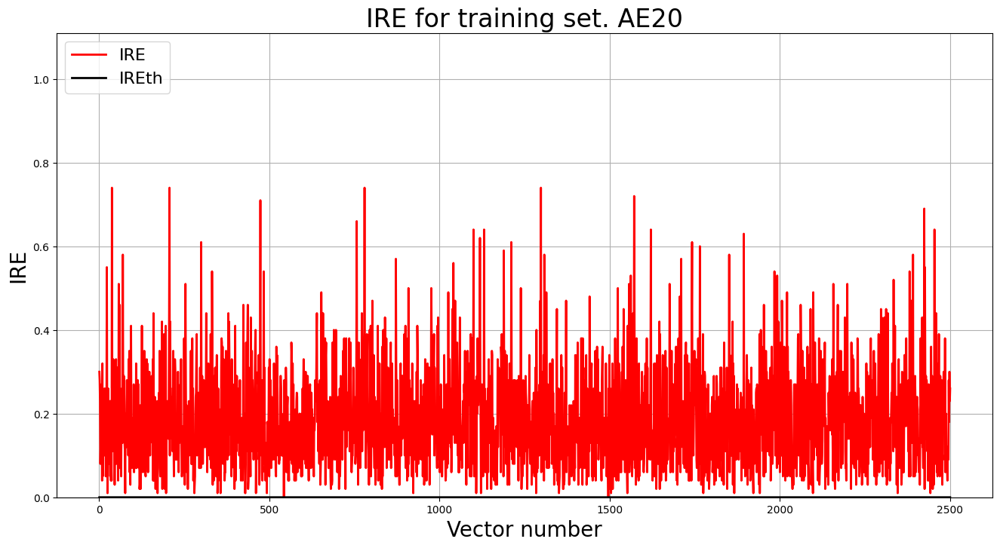

In [ ]:
# Построение графика ошибки реконструкции
lib_min.ire_plot('training', IRE20, IREth20, 'AE20')

285/285 [==============================] - 1s 2ms/step


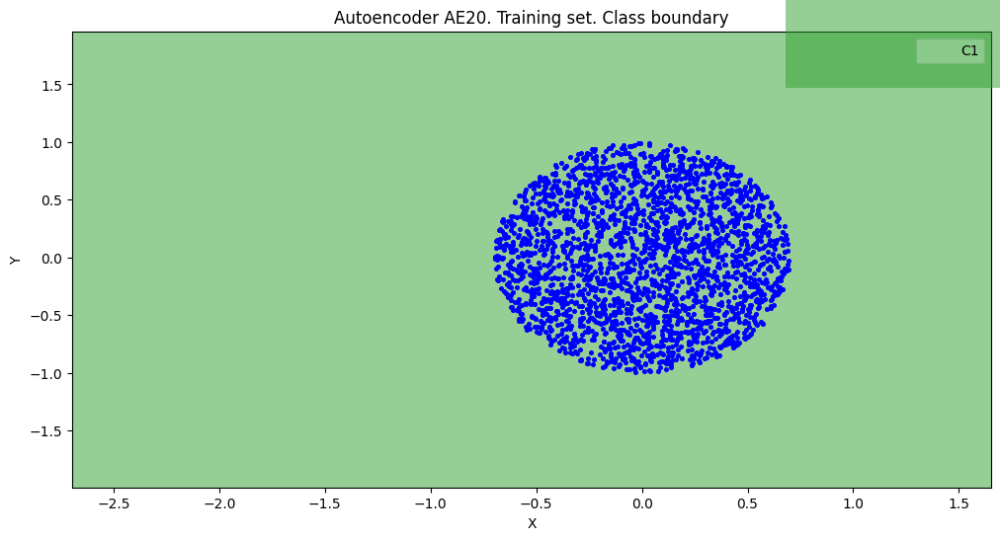

amount:  135
amount_ae:  0


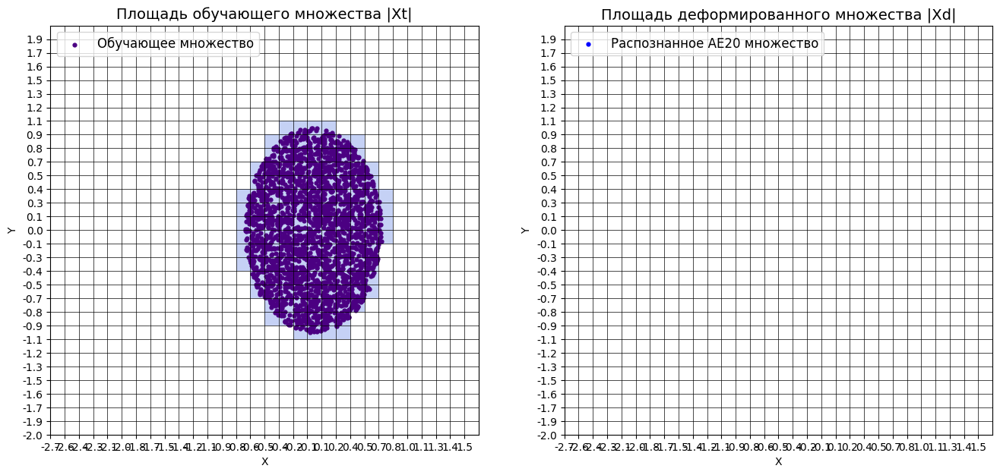

IndexError: index 0 is out of bounds for axis 0 with size 0

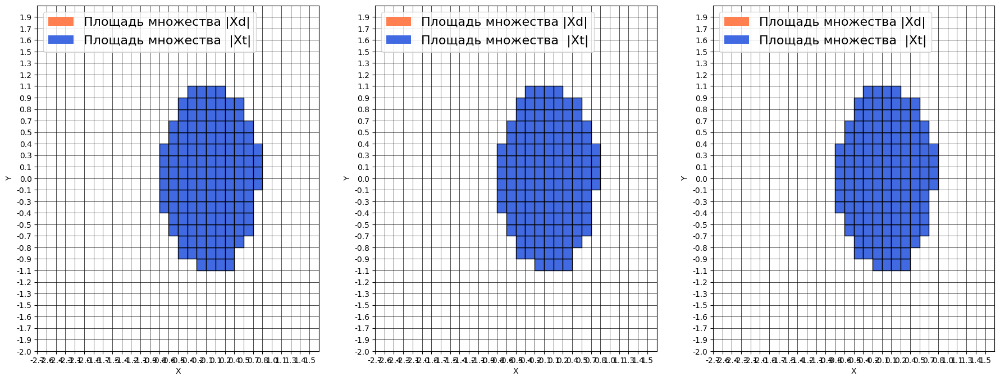

In [ ]:
# построение областей покрытия и границ классов
# расчет характеристик качества обучения
numb_square = 30
xx, yy, Z20 = lib_min.square_calc(numb_square, data_el, ae20_trained, IREth20, '20', True)